# Pan fetal reference vs. ATO G2G Analysis (T1 Lineage with GPLVM estimates)

In [67]:
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sb
import scipy.stats as stats
import matplotlib.pyplot as plt
import os,sys,inspect
# setting the path to source
sys.path.insert(0,os.path.dirname(os.getcwd()) + '/source') 
# new source imports 
import OrgAlign as orgalign
import Main
import MyFunctions 
import TimeSeriesPreprocessor
import ClusterUtils
import warnings
import scanpy as sc
warnings.filterwarnings("ignore")

# Load the adata objects with GPLVM estimated pseudotime
adata_ref = anndata.read_h5ad('adata_ref_SPTLineage_gplvm.h5ad')
adata_query =  anndata.read_h5ad('adata_org_SPTLineage_gplvm.h5ad')

In [30]:
adata_ref

AnnData object with n_obs × n_vars = 20327 × 20240
    obs: 'ANNOTATION_COMB', 'time', 'bbk', 'n_counts', 'refined_time', 'bin_ids', 'ID'
    var: 'n_cells'
    uns: 'log1p', 'ANNOTATION_COMB_colors'
    obsm: 'X_gplvm', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [32]:
adata_query 

AnnData object with n_obs × n_vars = 17176 × 20240
    obs: 'ANNOTATION_COMB', 'time', 'n_counts', 'refined_time', 'bin_ids', 'ID'
    var: 'n_cells'
    uns: 'log1p', 'ANNOTATION_COMB_colors'
    obsm: 'X_gplvm', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

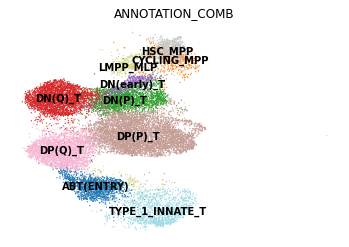

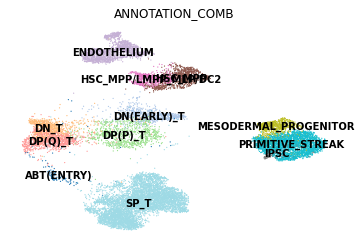

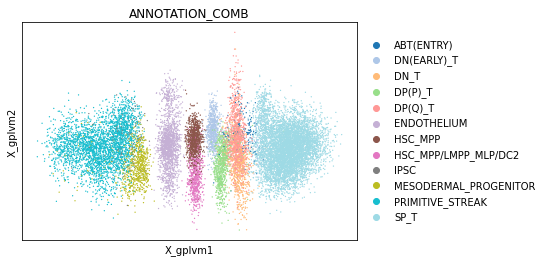

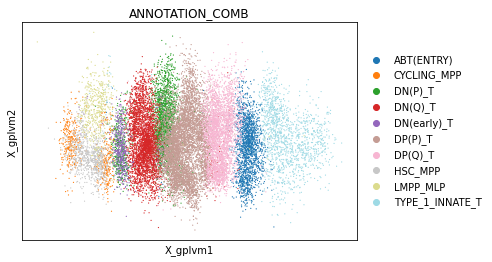

In [2]:
sc.pl.umap(adata_ref,color = ['ANNOTATION_COMB'],palette='tab20', frameon=False, size=6,legend_loc='on data') 
sc.pl.umap(adata_query,color = ['ANNOTATION_COMB'],palette='tab20', frameon=False, size=6,legend_loc='on data') 
sc.pl.embedding(adata_query, 'X_gplvm', color='ANNOTATION_COMB')
sc.pl.embedding(adata_ref, 'X_gplvm', color='ANNOTATION_COMB')

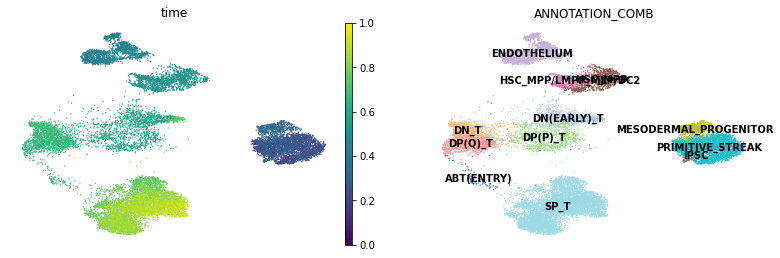

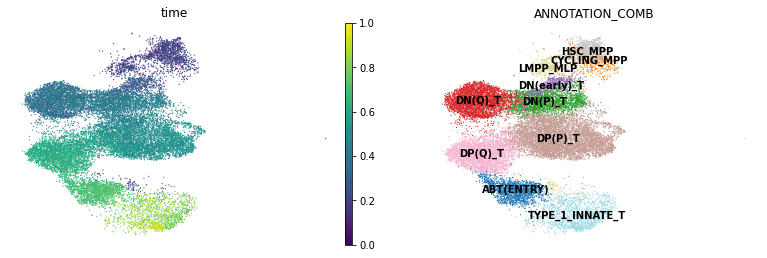

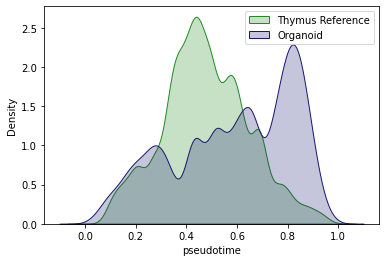

In [3]:
# normalising the pseudotime to [0,1] range
x = TimeSeriesPreprocessor.Utils.minmax_normalise(np.asarray(adata_ref.obs.gplvm_pseudotime))
adata_ref.obs['time'] = x
x = TimeSeriesPreprocessor.Utils.minmax_normalise(np.asarray(adata_query.obs.gplvm_pseudotime))
adata_query.obs['time'] = x

sc.pl.umap(adata_query,color = ['time','ANNOTATION_COMB'],palette='tab20',legend_loc='on data',frameon=False)
sc.pl.umap(adata_ref,color = ['time','ANNOTATION_COMB'],palette='tab20',legend_loc='on data', frameon=False)

sb.kdeplot(adata_ref.obs['time'], fill=True, label='Thymus Reference', color='forestgreen') 
sb.kdeplot(adata_query.obs['time'], fill=True, label='Organoid', color='midnightblue'); plt.xlabel('pseudotime'); plt.legend()
plt.show()

In [4]:
np.unique(adata_ref.obs.ANNOTATION_COMB, return_counts=True)

(array(['ABT(ENTRY)', 'CYCLING_MPP', 'DN(P)_T', 'DN(Q)_T', 'DN(early)_T',
        'DP(P)_T', 'DP(Q)_T', 'HSC_MPP', 'LMPP_MLP', 'TYPE_1_INNATE_T'],
       dtype=object),
 array([1776,  560, 2465, 3432,  499, 5741, 3110,  837,  494, 1413]))

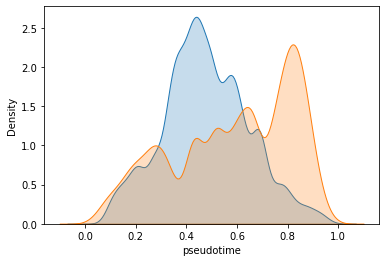

preprocessing
preprocessing


In [5]:
# Load relevant all gene counts for the ref and ato data, and preprocess (upto log1p normalisation)
adata_ref_all_genes = anndata.read_h5ad('adata_ref_SPTLineage_all_genes_b4_preprocessing.h5ad')
adata_query_all_genes =  anndata.read_h5ad('adata_ato_SPTLineage_all_genes_b4_preprocessing.h5ad')

adata_ref_bck = adata_ref.copy()
adata_query_bck = adata_query.copy()

adata_ref_temp = anndata.AnnData(X=adata_ref_all_genes[adata_ref.obs_names].X)
adata_ref_temp.var_names = adata_ref_all_genes[adata_ref.obs_names].var_names
adata_ref_temp.obs_names = adata_ref.obs_names
adata_ref_temp.obs['ANNOTATION_COMB'] = adata_ref.obs['ANNOTATION_COMB']
adata_ref_temp.obs['time'] = adata_ref.obs['time']
adata_ref_temp.obsm['X_umap'] = adata_ref.obsm['X_umap']
adata_ref_temp.obsm['X_gplvm'] = adata_ref.obsm['X_gplvm']
adata_ref_temp.obsm['X_scVI'] = adata_ref.obsm['X_scVI']
adata_ref_temp.obsp['connectivities'] = adata_ref.obsp['connectivities'] 
adata_ref_temp.obsp['distances'] = adata_ref.obsp['distances'] 
adata_ref_temp.obs['bbk'] = adata_ref.obs['bbk'] 

adata_query_temp = anndata.AnnData(X=adata_query_all_genes [adata_query.obs_names].X)
adata_query_temp.var_names = adata_query_all_genes [adata_query.obs_names].var_names
adata_query_temp.obs_names = adata_query.obs_names
adata_query_temp.obs['ANNOTATION_COMB'] = adata_query.obs['ANNOTATION_COMB']
adata_query_temp.obs['time'] = adata_query.obs['time']
adata_query_temp.obsm['X_umap'] = adata_query.obsm['X_umap']
adata_query_temp.obsm['X_gplvm'] = adata_query.obsm['X_gplvm']
adata_query_temp.obsm['X_scVI'] = adata_query.obsm['X_scVI']
adata_query_temp.obsp['connectivities'] = adata_query.obsp['connectivities'] 
adata_query_temp.obsp['distances'] = adata_query.obsp['distances'] 

adata_ref = adata_ref_temp
adata_query = adata_query_temp

# Examine ref and query pseudotime distributions
sb.kdeplot(adata_ref.obs['time'], fill=True, label='Refernce') 
sb.kdeplot(adata_query.obs['time'], fill=True,label='Organoid'); plt.xlabel('pseudotime')
plt.show()

def preprocess(adata):
    print('preprocessing')
    sc.pp.filter_genes(adata, min_cells=3) 
    adata.layers["counts"] = adata.X.copy()
    sc.pp.normalize_per_cell(adata, 10000) 
    sc.pp.log1p(adata)
    return adata
adata_ref = preprocess(adata_ref)
adata_query = preprocess(adata_query)
common_genes = np.intersect1d(adata_ref.var_names, adata_query.var_names)
adata_ref = adata_ref[:,common_genes]
adata_query = adata_query[:,common_genes]

In [6]:
adata_ref.write_h5ad('PanfetalATO_SPT_gplvm_ref_21122022.h5ad')
adata_query.write_h5ad('PanfetalATO_SPT_gplvm_ATO_21122022.h5ad')

# G2G Run on human TFs

In [1]:
import anndata
import time 
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sb
import scipy.stats as stats
import matplotlib.pyplot as plt
import os,sys,inspect
import pickle
from tqdm import tqdm
# setting the path to source
sys.path.insert(0,os.path.dirname(os.getcwd()) + '/source') 
# new source imports 
import OrgAlign as orgalign
import Main
import MyFunctions 
import TimeSeriesPreprocessor
import ClusterUtils
import PathwayAnalyserV2
import VisualUtils
import colorcet as cc

adata_ref = anndata.read_h5ad('PanfetalATO_SPT_gplvm_ref_21122022.h5ad')
adata_query = anndata.read_h5ad('PanfetalATO_SPT_gplvm_ATO_21122022.h5ad')

In [22]:
def refine_pseudotime(adata):
    average_ctype_mean_times = {}

    for ctype in np.unique(adata.obs.ANNOTATION_COMB):
        average_ctype_mean_times[ctype] = np.mean(adata[adata.obs.ANNOTATION_COMB==ctype].obs.time)
    
    #adata.obs['refined_time'] = adata.obs.time 
    
    ctype_Ls = {}
    ctype_Us = {}

    for ctype in np.unique(adata.obs.ANNOTATION_COMB):    
        ctype_adata = adata[adata.obs.ANNOTATION_COMB==ctype]
        Q1,Q3 = np.percentile( ctype_adata.obs.time, [25,75])
        IQR = Q3-Q1
        U = Q3+(1.5 * IQR)
        L = Q1-(1.5 * IQR)
        ctype_Ls[ctype] = L
        ctype_Us[ctype] = U

    n = 0 
    ctype_out_stat = {}
    for i in range(adata.shape[0]):
        ctype = adata.obs.ANNOTATION_COMB[i]
        if(adata.obs.time[i]<ctype_Ls[ctype] or adata.obs.time[i]>ctype_Us[ctype]):
            n+=1
            if(ctype in ctype_out_stat.keys()):
                ctype_out_stat[ctype] += 1
            else:
                ctype_out_stat[ctype] = 0 

    return  n, ctype_out_stat

In [23]:
refine_pseudotime(adata_ref)

(42,
 {'ABT(ENTRY)': 13,
  'DN(P)_T': 11,
  'DN(Q)_T': 5,
  'DN(early)_T': 4,
  'DP(P)_T': 0,
  'DP(Q)_T': 1,
  'LMPP_MLP': 1})

In [24]:
refine_pseudotime(adata_query)

(38,
 {'MESODERMAL_PROGENITOR': 11,
  'IPSC': 1,
  'DN_T': 12,
  'DP(Q)_T': 6,
  'DP(P)_T': 2,
  'SP_T': 0})

In [15]:
print(refine_pseudotime(adata_ref)) 
refine_pseudotime(adata_ref)*100/20327

42


0.20662173463865793

In [18]:
print(refine_pseudotime(adata_query))
refine_pseudotime(adata_query)*100/17176

38


0.22123893805309736

In [16]:
adata_query/17176

AnnData object with n_obs × n_vars = 17176 × 20240
    obs: 'ANNOTATION_COMB', 'time', 'n_counts', 'refined_time', 'bin_ids'
    var: 'n_cells'
    uns: 'ANNOTATION_COMB_colors', 'log1p'
    obsm: 'X_gplvm', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [2]:
adata_ref.obs['time'] = TimeSeriesPreprocessor.refine_pseudotime(adata_ref)
adata_query.obs['time'] = TimeSeriesPreprocessor.refine_pseudotime(adata_query)

(-0.25, 15.95, 0.0, 105.0)

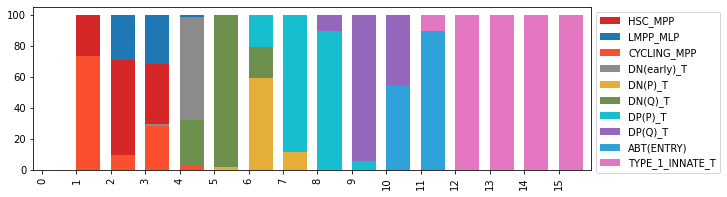

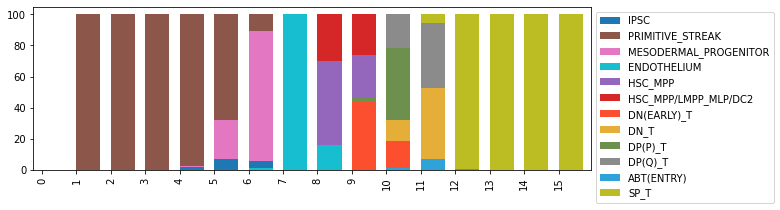

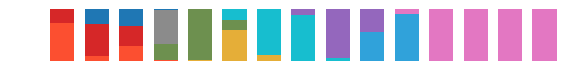

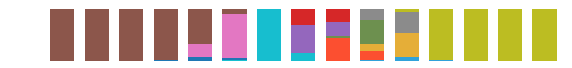

In [3]:
# Bins visualisation --- Each cell is annotatated with its respective bin based on the closest interpolated pseudotime point
# There n_artificial_points = 15 bin margins within the [0,1) range 
# for all cells with pseudotime t>=bin_margins[i] and t<bin_margins[i+1], allocate bin id as i; 
# for final bin  t>=bin_margins[i] and t<=bin_margins[i+1]
# then we plot cell type proportions for each bin 0-14
vs = VisualUtils.VisualUtils(adata_ref, adata_query, cell_type_colname = 'ANNOTATION_COMB', 
                S_len=15, 
                T_len=15, 
                titleS='Thymus (Reference)', titleT='ATO (Query)',
                write_file=False)

ax = vs.metaS.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=sb.color_palette(cc.glasbey_hv, n_colors=20), grid = False, legend=True, width=0.7,align='edge',figsize=(10,3))
order_S_legend = [7,8,1,4,2,3,5,6,0,9]
order_T_legend = [8,10,9,5,6,7,1,2,3,4,0,11]
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=[handles[idx] for idx in order_S_legend],labels=[labels[idx] for idx in order_S_legend],bbox_to_anchor=(1.0, 1.0))
#plt.legend(title='Cell Type',bbox_to_anchor=(1.2, 0.2))
ax = vs.metaT.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=sb.color_palette(cc.glasbey_hv, n_colors=12), grid = False, legend=True, width=0.7,align='edge',figsize=(10,3))
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=[handles[idx] for idx in order_T_legend],labels=[labels[idx] for idx in order_T_legend],bbox_to_anchor=(1.0, 1.0))
vs.metaS.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=sb.color_palette(cc.glasbey_hv, n_colors=12), grid = False, legend=False, width=0.7,align='edge',figsize=(10,1))
plt.axis('off')
vs.metaT.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=sb.color_palette(cc.glasbey_hv, n_colors=12), grid = False, legend=False, width=0.7,align='edge',figsize=(10,1))
plt.axis('off')

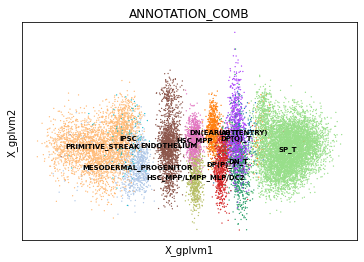

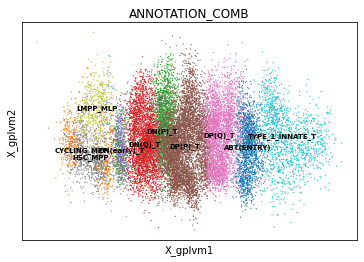

In [5]:

sc.pl.embedding(adata_query, 'X_gplvm', color='ANNOTATION_COMB', legend_loc='on data', legend_fontsize=7)
sc.pl.embedding(adata_ref, 'X_gplvm', color='ANNOTATION_COMB', legend_loc='on data', legend_fontsize=7)

In [6]:
# Load the Human TF list
def get_human_TF_list(): 
    # get a human TF list 
    TF_list = pd.read_csv('huamn_TF_list.csv',skiprows=1)
    np.unique(TF_list['Unnamed: 3'], return_counts=True) # There are only 1639 true TFs out of 2765 TFs in this list 
    TF_list = TF_list[TF_list['Unnamed: 3']=='Yes']
    TF_list['Name']
    return TF_list
human_TFs = get_human_TF_list()
human_TFs = np.intersect1d(human_TFs.Name, adata_ref.var_names) 

In [7]:
def run_G2G_alignment(adata_ref, adata_query, gene_list, n_interpolation_timepoints=15):
    start_t = time.time()
    aligner = Main.RefQueryAligner(adata_ref, adata_query, gene_list,n_interpolation_timepoints)
    aligner.WEIGHT_BY_CELL_DENSITY = True
    aligner.WINDOW_SIZE=0.1
    aligner.align_all_pairs() 
    end_t = time.time()
    print(end_t-start_t)
    return aligner

In [8]:
gene_list = human_TFs 
aligner = run_G2G_alignment(adata_ref, adata_query, gene_list, n_interpolation_timepoints=15)


WINDOW_SIZE= 0.1


  0%|          | 0/1371 [00:00<?, ?it/s]

13303.179208755493


IIDMMMMMMMMMMMMMD


Text(73.57777777777778, 0.5, 'Organoid pseudotime')

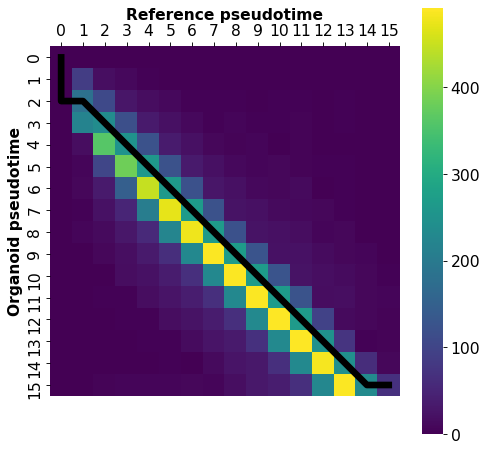

In [10]:
# Overall representative alignment 
sc.set_figure_params(figsize=(6,6))
average_alignment, alignment_path =  ClusterUtils.get_cluster_average_alignments(aligner, aligner.gene_list)
mat = aligner.get_pairwise_match_count_mat()
print(average_alignment)
VisualUtils.VisualUtils.plot_alignment_path_on_given_matrix(paths = [alignment_path], mat=mat, annot=False)
plt.xlabel('Reference pseudotime')
plt.ylabel('Organoid pseudotime')

In [9]:
pickle.dump(aligner, open('Aligner_SPT_humanTFs_24012023.pkl', 'wb')) 

In [11]:
adata_ref.write_h5ad('PanfetalATO_SPT_gplvm_ref_24012023.h5ad')
adata_query.write_h5ad('PanfetalATO_SPT_gplvm_ATO_24012023.h5ad')

# G2G Analysis

In [7]:
import anndata
import time 
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sb
import scipy.stats as stats
import matplotlib.pyplot as plt
import os,sys,inspect
import pickle
from tqdm import tqdm
# setting the path to source
sys.path.insert(0,os.path.dirname(os.getcwd()) + '/source') 
# new source imports 
import OrgAlign as orgalign
import Main
import MyFunctions 
import TimeSeriesPreprocessor
import ClusterUtils
import PathwayAnalyserV2
import VisualUtils
import colorcet as cc

# Load relevant adata ref and ATO objects and the G2G aligner obj
# WINDOW SIZE = 0.1 VERSION
adata_ref = anndata.read_h5ad('PanfetalATO_SPT_gplvm_ref_24012023.h5ad')
adata_query = anndata.read_h5ad('PanfetalATO_SPT_gplvm_ATO_24012023.h5ad')
with open('Aligner_SPT_humanTFs_24012023.pkl', 'rb') as f:
    aligner = pickle.load(f)

In [9]:
adata_ref.obs.time

FCAImmP7277556-TGATTTCGTTTCGCTC    0.690309
FCAImmP7292034-ACTTACTAGTTGTCGT    0.671749
FCAImmP7528283-TATCAGGAGCCATCGC    0.666822
FCAImmP7277556-GAAACTCAGTGAACGC    0.650598
FCAImmP7528294-CGAGAAGCATACCATG    0.703901
                                     ...   
FCAImmP7579220-GTCCTCATCAACACTG    0.807589
FCA_gut8015061-GCGGGTTCAGATGAGC    0.799761
FCAImmP7803021-CAAGGCCCAAGTTAAG    0.767225
FCAImmP7803021-CGGACACCAGCTGTAT    0.759780
FCAImmP7803038-ACGGAGATCACGCATA    0.871441
Name: time, Length: 20327, dtype: float64

In [10]:
adata_ref.obs.refined_time

FCAImmP7277556-TGATTTCGTTTCGCTC    0.709171
FCAImmP7292034-ACTTACTAGTTGTCGT    0.691741
FCAImmP7528283-TATCAGGAGCCATCGC    0.687114
FCAImmP7277556-GAAACTCAGTGAACGC    0.671879
FCAImmP7528294-CGAGAAGCATACCATG    0.721935
                                     ...   
FCAImmP7579220-GTCCTCATCAACACTG    0.819307
FCA_gut8015061-GCGGGTTCAGATGAGC    0.811957
FCAImmP7803021-CAAGGCCCAAGTTAAG    0.781402
FCAImmP7803021-CGGACACCAGCTGTAT    0.774410
FCAImmP7803038-ACGGAGATCACGCATA    0.879271
Name: refined_time, Length: 20327, dtype: float64

In [2]:
print(adata_ref.shape)
print(adata_query.shape)
adata_ref.obs['ID'] = np.repeat('Reference',adata_ref.shape[0])
adata_query.obs['ID'] = np.repeat('Organoid',adata_query.shape[0])
adata_all = anndata.concat([adata_ref, adata_query])
print(adata_all.shape)
aligner.WINDOW_SIZE

(20327, 20240)
(17176, 20240)
(37503, 20240)


0.1

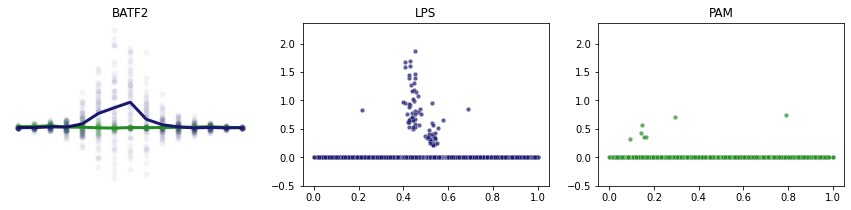

In [6]:
    def plotTimeSeries(al_obj, refQueryAlignerObj, plot_cells = False, plot_mean_trend= False):
        plt.subplots(1,3,figsize=(15,3))
        plt.subplot(1,3,1)
        plotTimeSeriesAlignment(al_obj) 
        plt.subplot(1,3,2)
        
        max_val = np.max([np.max(np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene])), np.max(np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]))])
        min_val = np.min([np.min(np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene])), np.min(np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]))])

        g = sb.scatterplot(refQueryAlignerObj.query_time, np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]), alpha=0.7,  #hue=query_capture_time_labels,  
                       #palette=sb.color_palette("blend:#B9DBF4,#95AAD3,#3A68AE,#155289", as_cmap=True), legend=True)
                           #palette=sb.color_palette("light:#191970", as_cmap=True)
                           color = 'midnightblue', legend=False,linewidth=0.3, s=20)  #edgecolor='k'
        #plt.legend(title='Capture time',loc = 'lower right', labels=capture_time_points,fontsize=12 , bbox_to_anchor=(1.1, 1.05) )
        #plt.setp(g.get_legend().get_title(), fontsize='12')
        plt.title('LPS')
       # plt.xlabel('pseudotime')
      #  plt.ylabel('Gene expression', fontsize=14)
        plt.ylim([min_val-0.5,max_val+0.5])
        #sb.scatterplot(refQueryAlignerObj.ref_time, np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene]), color = 'black', alpha=0.4, legend=False, marker='+')
        plt.subplot(1,3,3)
        g = sb.scatterplot(refQueryAlignerObj.ref_time, np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene]), color = 'forestgreen', alpha=0.7, #hue=ref_capture_time_labels, 
                         # palette=sb.cubehelix_palette(start=2, rot=0, dark=0.2, light=.9, reverse=False, as_cmap=True), legend=False )
                         # palette=sb.color_palette("light:#228B22", as_cmap=True), legend=False)
                       #  palette=sb.color_palette("blend:#C8DBC8,#94C47D,#628D56,#335A30", as_cmap=True), 
                           legend=False,linewidth=0.3,s=20 ) #edgecolor='k'
       # plt.legend(title='Capture time',loc = 'lower right', labels=capture_time_points,fontsize=12 ,bbox_to_anchor=(1.1, 1.05))
       # plt.setp(g.get_legend().get_title(), fontsize='12')
        plt.title('PAM')
      #  plt.xlabel('pseudotime')
      #  plt.ylabel('Gene expression', fontsize=12)
        plt.ylim([min_val-0.5,max_val+0.5])
       # sb.scatterplot(refQueryAlignerObj.query_time, np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]), color = 'black', alpha=0.4, legend=False, marker='+')
 
    def plotTimeSeriesAlignment(al_obj):  
        sb.scatterplot(al_obj.S.X, al_obj.S.Y, color = 'forestgreen' ,alpha=0.05, legend=False)#, label='Ref') 
        sb.scatterplot(al_obj.T.X, al_obj.T.Y, color = 'midnightblue' ,alpha=0.05, legend=False)#, label ='Query') 
       # plt.legend(loc='upper left')
        al_obj.plot_mean_trends() 
        plt.title(al_obj.gene)
        plt.xlabel('pseudotime')
        plt.ylabel('Gene expression')
        plt.axis('off')
        
        for i in range(al_obj.matched_region_DE_info.shape[0]):
            S_timebin = int(al_obj.matched_region_DE_info.iloc[i]['ref_bin'])
            T_timebin = int(al_obj.matched_region_DE_info.iloc[i]['query_bin']) 
            x_vals = [al_obj.matched_region_DE_info.iloc[i]['ref_pseudotime'],al_obj.matched_region_DE_info.iloc[i]['query_pseudotime']] 
            y_vals = [al_obj.S.mean_trend[S_timebin ], al_obj.T.mean_trend[T_timebin]] 
            plt.plot(x_vals, y_vals, color='black', linestyle='dashed', linewidth=0.6)

    plotTimeSeries(aligner.results_map['BATF2'], aligner, plot_cells=True) 
    plt.savefig('BATF2.png', bbox_inches='tight')

In [1]:
#aligner.results_map['FOXP1'].plotTimeSeriesAlignment()
#aligner.results_map['FOXP1'].fwd_DP.opt_cost

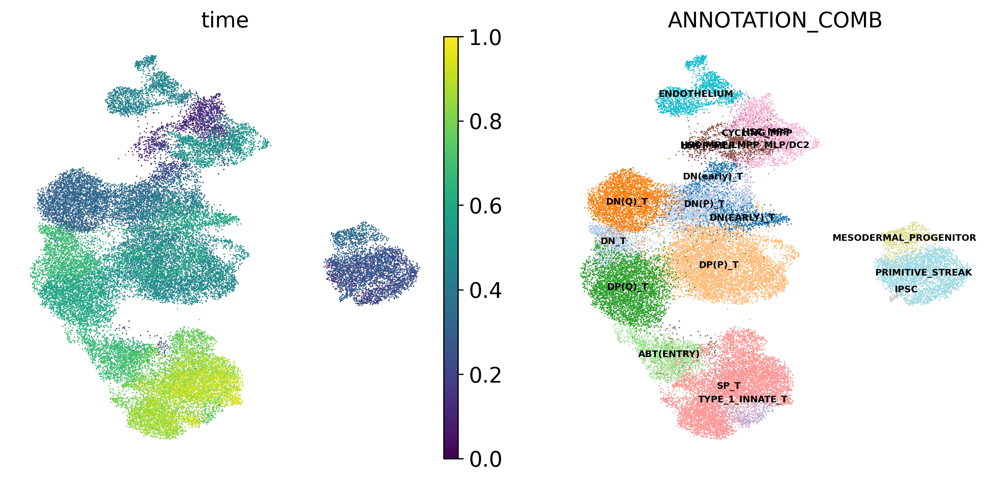

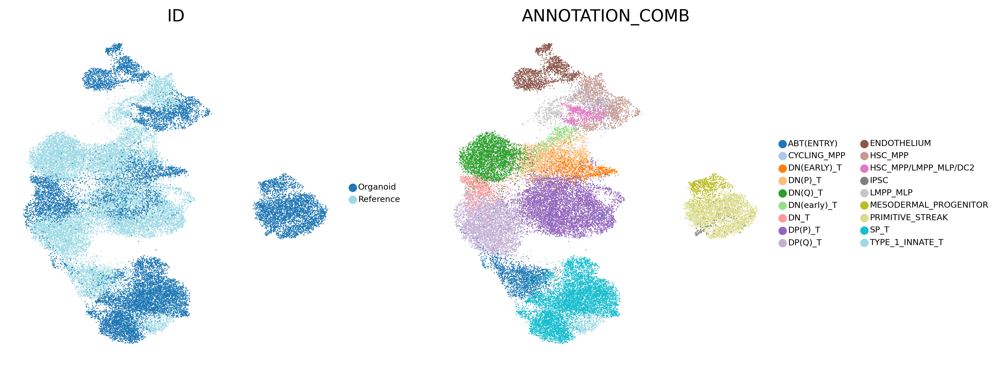

In [5]:

vega_20 = [
    '#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c', '#98df8a', '#d62728',
    '#ff9896', '#9467bd', '#c5b0d5', '#8c564b', '#c49c94', '#e377c2', '#f7b6d2',
    '#7f7f7f', '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5',
]

all_cmap = {
        'CYCLING_MPP': vega_20[12],
        'HSC_MPP':vega_20[13],
        'LMPP_MLP':vega_20[10],
        'DN(early)_T': vega_20[0],
        'DN(P)_T':vega_20[1],
        'DN(Q)_T':vega_20[2],
        'DP(P)_T': vega_20[3],
        'DP(Q)_T':vega_20[4],
        'ABT(ENTRY)':vega_20[5],
        'TYPE_1_INNATE_T':vega_20[9],
            'PRIMITIVE_STREAK': vega_20[19],
            'IPSC':  vega_20[15],
            'HSC_MPP':  vega_20[13],
            'HSC_MPP/LMPP_MLP/DC2':  vega_20[10],
            'MESODERMAL_PROGENITOR':  vega_20[17],
            'ENDOTHELIUM':vega_20[18],
            'DN(EARLY)_T':vega_20[0],
            'DN_T':vega_20[1],
            'DP(P)_T':vega_20[3],
            'DP(Q)_T':vega_20[4],
           'ABT(ENTRY)':vega_20[5],
            'SP_T':vega_20[7]
           }



sc.set_figure_params(figsize=(5,5), dpi=300)
sc.pl.umap(adata_all,color = ['time','ANNOTATION_COMB'],palette=all_cmap,legend_loc='on data',frameon=False,legend_fontsize=6, save='umap.pdf')
sc.set_figure_params(figsize=(5,5), dpi=300)
sc.pl.umap(adata_all,color = ['ID','ANNOTATION_COMB'],palette='tab20',frameon=False,legend_fontsize=7)

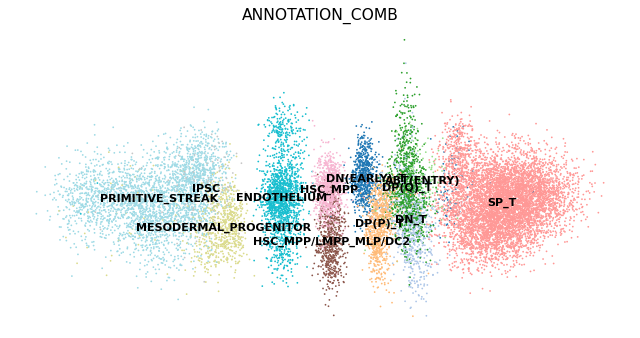

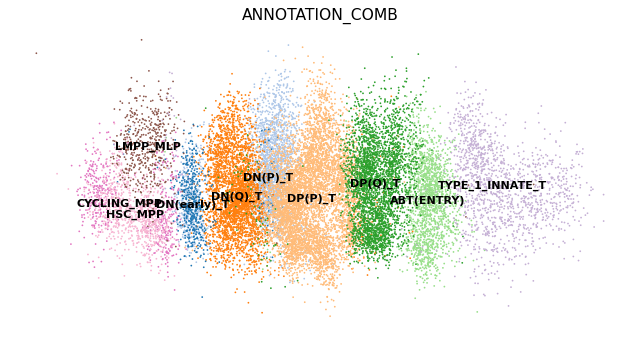

In [6]:
#sc.set_figure_params(figsize=(5,5), dpi=300)
#sc.pl.umap(adata_query,color = ['time','ANNOTATION_COMB'],palette='tab20',legend_loc='on data',frameon=False,legend_fontsize=7)
#sc.pl.umap(adata_ref,color = ['time','ANNOTATION_COMB'],palette='tab20',legend_loc='on data', frameon=False,legend_fontsize=7)
sc.set_figure_params(figsize=(10,5))
vega_20 = [
    '#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c', '#98df8a', '#d62728',
    '#ff9896', '#9467bd', '#c5b0d5', '#8c564b', '#c49c94', '#e377c2', '#f7b6d2',
    '#7f7f7f', '#c7c7c7', '#bcbd22', '#dbdb8d', '#17becf', '#9edae5',
]
sc.pl.embedding(adata_query, 'X_gplvm', color='ANNOTATION_COMB', legend_loc='on data',  frameon=False,legend_fontsize=10,s=10, palette=all_cmap, save='ato_gplvm.pdf')
sc.pl.embedding(adata_ref, 'X_gplvm', color='ANNOTATION_COMB', legend_loc='on data', frameon=False,legend_fontsize=10,s=10,palette=all_cmap, save='ref_gplvm.pdf')

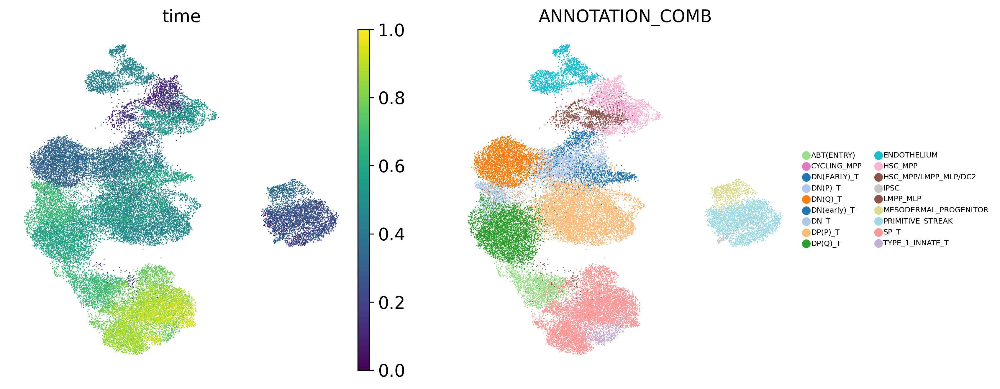

In [7]:
sc.set_figure_params(figsize=(5,5), dpi=300)
sc.pl.umap(adata_all,color = ['time','ANNOTATION_COMB'],palette=all_cmap,frameon=False,legend_fontsize=6, save='umap.pdf')


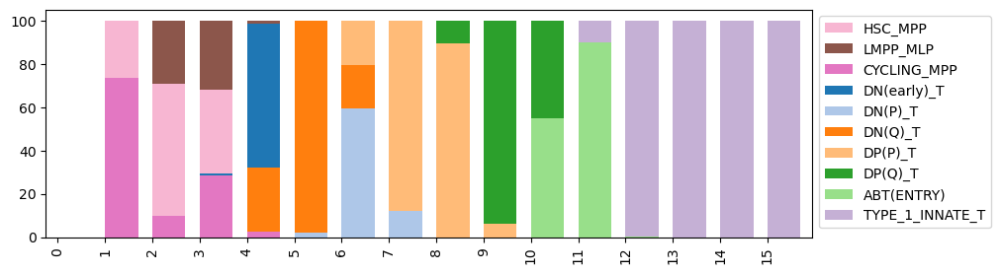

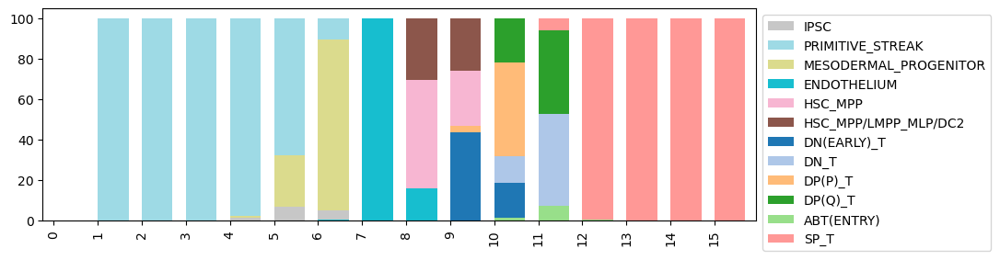

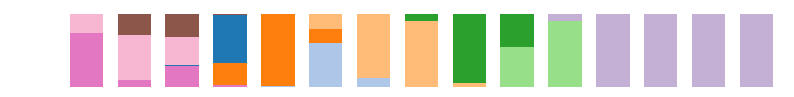

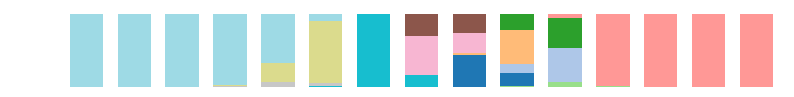

In [9]:
# Bins visualisation --- Each cell is annotatated with its respective bin based on the closest interpolated pseudotime point
# There n_artificial_points = 15 bin margins within the [0,1) range 
# for all cells with pseudotime t>=bin_margins[i] and t<bin_margins[i+1], allocate bin id as i; 
# for final bin  t>=bin_margins[i] and t<=bin_margins[i+1]
# then we plot cell type proportions for each bin 0-14
import matplotlib.style
import matplotlib as mpl
mpl.style.use('default')

vs = VisualUtils.VisualUtils(adata_ref, adata_query, cell_type_colname = 'ANNOTATION_COMB', 
                S_len=len(aligner.results[0].S.time_points), 
                T_len=len(aligner.results[0].T.time_points), 
                titleS='Thymus (Reference)', titleT='ATO (Query)',
                write_file=False)
zeileis_26 = [
    "#023fa5", "#7d87b9", "#bec1d4", "#d6bcc0", "#bb7784", "#8e063b", "#4a6fe3",
    "#8595e1", "#b5bbe3", "#e6afb9", "#e07b91", "#d33f6a", "#11c638", "#8dd593",
    "#c6dec7", "#ead3c6", "#f0b98d", "#ef9708", "#0fcfc0", "#9cded6", "#d5eae7",
    "#f3e1eb", "#f6c4e1", "#f79cd4",
    '#7f7f7f', "#c7c7c7", "#1CE6FF", "#336600"  # these last ones were added,
]



ref_cmap = {
        'CYCLING_MPP': vega_20[12],
        'HSC_MPP':vega_20[13],
        'LMPP_MLP':vega_20[10],
        'DN(early)_T': vega_20[0],
        'DN(P)_T':vega_20[1],
        'DN(Q)_T':vega_20[2],
        'DP(P)_T': vega_20[3],
        'DP(Q)_T':vega_20[4],
        'ABT(ENTRY)':vega_20[5],
        'TYPE_1_INNATE_T':vega_20[9]
       }
ato_cmap = { 
            'PRIMITIVE_STREAK': vega_20[19],
            'IPSC':  vega_20[15],
            'HSC_MPP':  vega_20[13],
            'HSC_MPP/LMPP_MLP/DC2':  vega_20[10],
            'MESODERMAL_PROGENITOR':  vega_20[17],
            'ENDOTHELIUM':vega_20[18],
            'DN(EARLY)_T':vega_20[0],
            'DN_T':vega_20[1],
            'DP(P)_T':vega_20[3],
            'DP(Q)_T':vega_20[4],
           'ABT(ENTRY)':vega_20[5],
            'SP_T':vega_20[7]
           }


ax = vs.metaS.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=ref_cmap, grid = False, legend=True, width=0.7,align='edge',figsize=(10,3))
order_S_legend = [7,8,1,4,2,3,5,6,0,9]
order_T_legend = [8,10,9,5,6,7,1,2,3,4,0,11]
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=[handles[idx] for idx in order_S_legend],labels=[labels[idx] for idx in order_S_legend],bbox_to_anchor=(1.0, 1.0))
#plt.legend(title='Cell Type',bbox_to_anchor=(1.2, 0.2))
ax = vs.metaT.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=ato_cmap, grid = False, legend=True, width=0.7,align='edge',figsize=(10,3))
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=[handles[idx] for idx in order_T_legend],labels=[labels[idx] for idx in order_T_legend],bbox_to_anchor=(1.0, 1.0))
vs.metaS.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=ref_cmap, grid = False, legend=False, width=0.7,align='edge',figsize=(10,1))
plt.axis('off')
plt.savefig('celltypes_barplot_ref.pdf')
vs.metaT.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=ato_cmap, grid = False, legend=False, width=0.7,align='edge',figsize=(10,1))
plt.axis('off')
plt.savefig('celltypes_barplot_ato.pdf')

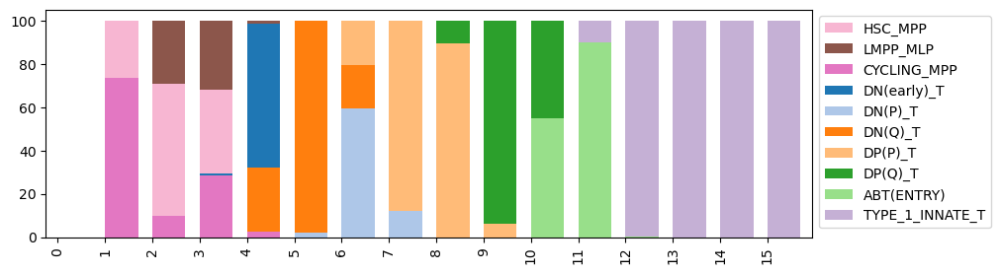

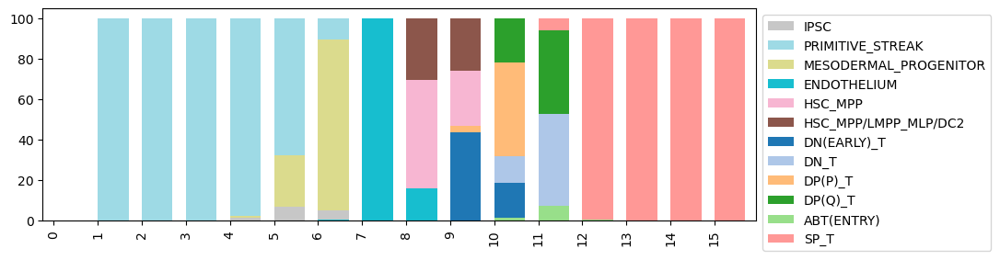

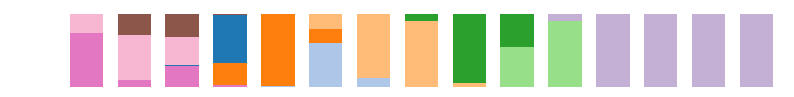

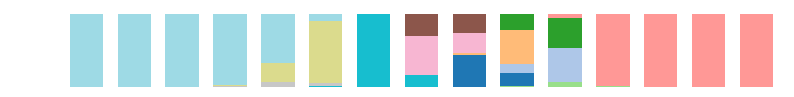

In [223]:
# Bins visualisation --- Each cell is annotatated with its respective bin based on the closest interpolated pseudotime point
# There n_artificial_points = 15 bin margins within the [0,1) range 
# for all cells with pseudotime t>=bin_margins[i] and t<bin_margins[i+1], allocate bin id as i; 
# for final bin  t>=bin_margins[i] and t<=bin_margins[i+1]
# then we plot cell type proportions for each bin 0-14
import matplotlib.style
import matplotlib as mpl
mpl.style.use('default')

vs = VisualUtils.VisualUtils(adata_ref, adata_query, cell_type_colname = 'ANNOTATION_COMB', 
                S_len=len(aligner.results[0].S.time_points), 
                T_len=len(aligner.results[0].T.time_points), 
                titleS='Thymus (Reference)', titleT='ATO (Query)',
                write_file=False)
zeileis_26 = [
    "#023fa5", "#7d87b9", "#bec1d4", "#d6bcc0", "#bb7784", "#8e063b", "#4a6fe3",
    "#8595e1", "#b5bbe3", "#e6afb9", "#e07b91", "#d33f6a", "#11c638", "#8dd593",
    "#c6dec7", "#ead3c6", "#f0b98d", "#ef9708", "#0fcfc0", "#9cded6", "#d5eae7",
    "#f3e1eb", "#f6c4e1", "#f79cd4",
    '#7f7f7f', "#c7c7c7", "#1CE6FF", "#336600"  # these last ones were added,
]



ref_cmap = {
        'CYCLING_MPP': vega_20[12],
        'HSC_MPP':vega_20[13],
        'LMPP_MLP':vega_20[10],
        'DN(early)_T': vega_20[0],
        'DN(P)_T':vega_20[1],
        'DN(Q)_T':vega_20[2],
        'DP(P)_T': vega_20[3],
        'DP(Q)_T':vega_20[4],
        'ABT(ENTRY)':vega_20[5],
        'TYPE_1_INNATE_T':vega_20[9]
       }
ato_cmap = { 
            'PRIMITIVE_STREAK': vega_20[19],
            'IPSC':  vega_20[15],
            'HSC_MPP':  vega_20[13],
            'HSC_MPP/LMPP_MLP/DC2':  vega_20[10],
            'MESODERMAL_PROGENITOR':  vega_20[17],
            'ENDOTHELIUM':vega_20[18],
            'DN(EARLY)_T':vega_20[0],
            'DN_T':vega_20[1],
            'DP(P)_T':vega_20[3],
            'DP(Q)_T':vega_20[4],
           'ABT(ENTRY)':vega_20[5],
            'SP_T':vega_20[7]
           }


ax = vs.metaS.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=ref_cmap, grid = False, legend=True, width=0.7,align='edge',figsize=(10,3))
order_S_legend = [7,8,1,4,2,3,5,6,0,9]
order_T_legend = [8,10,9,5,6,7,1,2,3,4,0,11]
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=[handles[idx] for idx in order_S_legend],labels=[labels[idx] for idx in order_S_legend],bbox_to_anchor=(1.0, 1.0))
#plt.legend(title='Cell Type',bbox_to_anchor=(1.2, 0.2))
ax = vs.metaT.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=ato_cmap, grid = False, legend=True, width=0.7,align='edge',figsize=(10,3))
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=[handles[idx] for idx in order_T_legend],labels=[labels[idx] for idx in order_T_legend],bbox_to_anchor=(1.0, 1.0))
vs.metaS.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=ref_cmap, grid = False, legend=False, width=0.7,align='edge',figsize=(10,1))
plt.axis('off')
plt.savefig('celltypes_barplot_ref.png')
vs.metaT.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=ato_cmap, grid = False, legend=False, width=0.7,align='edge',figsize=(10,1))
plt.axis('off')
plt.savefig('celltypes_barplot_ato.png')

In [ ]:

def get_matched_time_points(alignment_str):
        j = 0
        i = 0
        FLAG = False
        matched_points_S = [] 
        matched_points_T = [] 
        prev_c = ''
        for c in alignment_str:
            if(c=='M'):
                if(prev_c=='W'):
                    i=i+1
                if(prev_c=='V'):
                    j=j+1
                matched_points_T.append(i)
                matched_points_S.append(j)
                i=i+1
                j=j+1
            elif(c=='W'):
                if(prev_c not in ['W','V']):
                    i=i-1
                if(prev_c=='V'):
                    i=i-1
                    j=j+1
                if(prev_c=='D' and not FLAG):
                    FLAG = True
                matched_points_T.append(i)
                matched_points_S.append(j)
                j=j+1
            elif(c=='V'):
                if(prev_c not in ['W','V']):
                    j=j-1
                if(prev_c=='W'):
                    j=j-1
                    i=i+1
                if(prev_c=='I' and not FLAG):
                    FLAG = True
                matched_points_T.append(i)
                matched_points_S.append(j)
                i=i+1
            elif(c=='I'):
                if(prev_c=='W'):
                    i=i+1
                if(prev_c=='V'):
                    j=j+1
                i=i+1
            elif(c=='D'):
                if(prev_c=='W'):
                    i=i+1
                if(prev_c=='V'):
                    j=j+1
                j=j+1
            prev_c = c
        assert(len(matched_points_S) == len(matched_points_T)) 
        return matched_points_S, matched_points_T

def plot_comprehensive_alignment_landscape_plot(aligner, gene = None, order_S_legend=None, order_T_legend=None, paths_to_display=None, cmap='viridis'):

        if(gene!=None):
            al_obj = aligner.results_map[gene]
            if(paths_to_display==None):
                al_obj.landscape_obj.alignment_path.append([0,0])
                paths_to_display=[al_obj.landscape_obj.alignment_path]
            match_points_S = np.unique(al_obj.match_points_S) + 1
            match_points_T = np.unique(al_obj.match_points_T) + 1
            landscape_mat = pd.DataFrame(al_obj.landscape_obj.L_matrix)
        else:
            al_str, path  =ClusterUtils.get_cluster_average_alignments(aligner, aligner.gene_list )
            match_points_S, match_points_T = get_matched_time_points(al_str)
            match_points_S = np.unique(match_points_S) + 1
            match_points_T = np.unique(match_points_T) + 1
            if(paths_to_display==None):
                paths_to_display=[path]
            landscape_mat = aligner.get_pairwise_match_count_mat()
                
        nS_points=len(aligner.results[0].S.time_points)
        nT_points=len(aligner.results[0].T.time_points)

        order_S_legend = [7,8,1,4,2,3,5,6,0,9]
        order_T_legend = [8,10,9,5,6,7,1,2,3,4,0,11]
        
        fig, ((ax3, ax1, cbar_ax), (dummy_ax1, ax2, dummy_ax2)) = plt.subplots(nrows=2, ncols=3, figsize=(9*2, 10), sharex='col', sharey='row',
                                                                               gridspec_kw={'height_ratios': [0.5,0.05], 'width_ratios': [0.05, 0.5, 0.5]})
        g = sb.heatmap(landscape_mat.transpose(), xticklabels=True, yticklabels=True, cmap=cmap, cbar_ax=cbar_ax,  ax=ax1, cbar=False)
        g.tick_params( labelsize=10, labelbottom = True, bottom=True, top = False)#, labeltop=True)
        ax1.set_xlabel('pseudotime')
        x_ticks = np.asarray(range(0,nS_points+1)) 
        y_ticks = np.asarray(range(0,nT_points+1)) 

        # first barplot (Reference) --- left horizontal barplot
        p= vs.metaS.apply(lambda x: x*100/sum(x), axis=1).plot(kind='barh',stacked=True, title='Reference' ,color=ref_cmap, grid = False, ax=ax3,legend=False, width=0.7,align='edge')
        #plt.axis('off')
        
   #     for patch in p.patches:
   #         if(patch.get_y() in match_points_S):
   #             p.annotate(str('M'), (100, patch.get_y() * 1.005)  )   
                
        handles, labels = ax3.get_legend_handles_labels()
        for spine in p.spines:
            p.spines[spine].set_visible(False)
        if(order_S_legend!=None):
            dummy_ax1.legend(handles=[handles[idx] for idx in order_S_legend],labels=[labels[idx] for idx in order_S_legend])
        else:
            dummy_ax1.legend(handles,labels)
        # second barplot (Query) --- bottom barplot
        p = vs.metaT.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True, title='Organoid', color=ato_cmap, grid = False, ax=ax2, legend=False,width=0.7,align='edge')
        
   #     for patch in p.patches:
   #        # print(patch.get_height())
   #         if(patch.get_x() in match_points_T):
   #             p.annotate(str('M'), (patch.get_x() * 1.005, 100) )
        
        handles, labels = ax2.get_legend_handles_labels()
        for spine in p.spines:
            p.spines[spine].set_visible(False)
        if(order_T_legend!=None):
            dummy_ax2.legend(handles=[handles[idx] for idx in order_T_legend],labels=[labels[idx] for idx in order_T_legend],loc='upper left')
        else:
            dummy_ax2.legend(handles,labels, loc='upper left')
        dummy_ax2.get_legend().remove()
        dummy_ax1.get_legend().remove()
        dummy_ax1.axis('off')
        dummy_ax2.axis('off')
        cbar_ax.axis('off')
        if(paths_to_display!=None): # for max 2 paths
            styles = ['solid', 'dashed']; i = 0 
            for path in paths_to_display: 
                path_x = [p[0]+0.5 for p in path]
                path_y = [p[1]+0.5 for p in path]
                ax1.plot(path_x, path_y, color='black', linewidth=9, alpha=1.0, linestyle=styles[i]) # path plot
                i=i+1
        ax1.axis(ymin=0, ymax=nS_points+1, xmin=0, xmax=nT_points+1)
        plt.tight_layout()
        plt.show()
    
#vs = VisualUtils.VisualUtils(adata_ref, adata_query, cell_type_colname = 'ANNOTATION_COMB', 
#                S_len=len(aligner.results[0].S.time_points), 
#                T_len=len(aligner.results[0].T.time_points), 
#                titleS='PAM (Reference)', titleT='LPS(Query)',
#                write_file=False)

plot_comprehensive_alignment_landscape_plot(aligner) 

IIDMMMMMMMMMMMMMD


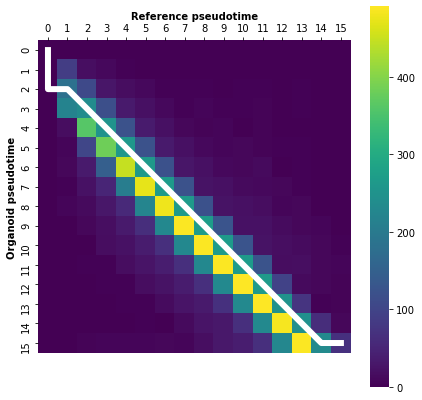

In [3]:
import VisualUtils

vs = VisualUtils.VisualUtils(adata_ref, adata_query, cell_type_colname = 'time', 
                S_len=len(aligner.results[0].S.time_points), 
                T_len=len(aligner.results[0].T.time_points), 
                titleS='Reference', titleT='Organoid',
                write_file=False)


#overall_alignment, alignment_path =vs.compute_overall_alignment(aligner)
overall_alignment, alignment_path =  ClusterUtils.get_cluster_average_alignments(aligner, aligner.gene_list)

mat = aligner.get_pairwise_match_count_mat()
print(overall_alignment)

def plot_alignment_path_on_given_matrix(mat, paths, cmap='viridis'):
        fig,ax = plt.subplots(1,1, figsize=(7,7))
        sb.heatmap(mat, square=True,  cmap='viridis', ax=ax, cbar=True)  
        for path in paths: 
            path_x = [p[0]+0.5 for p in path]
            path_y = [p[1]+0.5 for p in path]
            ax.plot(path_y, path_x, color='white', linewidth=6)
        plt.xlabel("Reference pseudotime",fontweight='bold')
        plt.ylabel("Organoid pseudotime",fontweight='bold')
        ax.xaxis.tick_top() # x axis on top
        ax.xaxis.set_label_position('top')

#plot_alignment_path_on_given_matrix(paths = [alignment_path], mat=mat, annot=False)
plot_alignment_path_on_given_matrix(paths = [alignment_path], mat=mat)
#plt.savefig('T1_vs_ATO_overall.pdf')

'IIIIIIDDMMMMMMMMMDDDD'

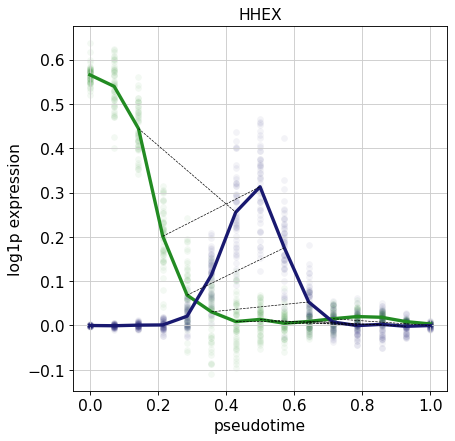

In [29]:
aligner.results_map['HHEX'].plotTimeSeriesAlignment()
aligner.results_map['HHEX'].alignment_str

In [70]:
adata_ref

AnnData object with n_obs × n_vars = 20327 × 20240
    obs: 'ANNOTATION_COMB', 'time', 'bbk', 'n_counts', 'refined_time', 'bin_ids', 'ID'
    var: 'n_cells'
    uns: 'ANNOTATION_COMB_colors', 'log1p'
    obsm: 'X_gplvm', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [69]:
len(aligner.gene_list)

1371

run


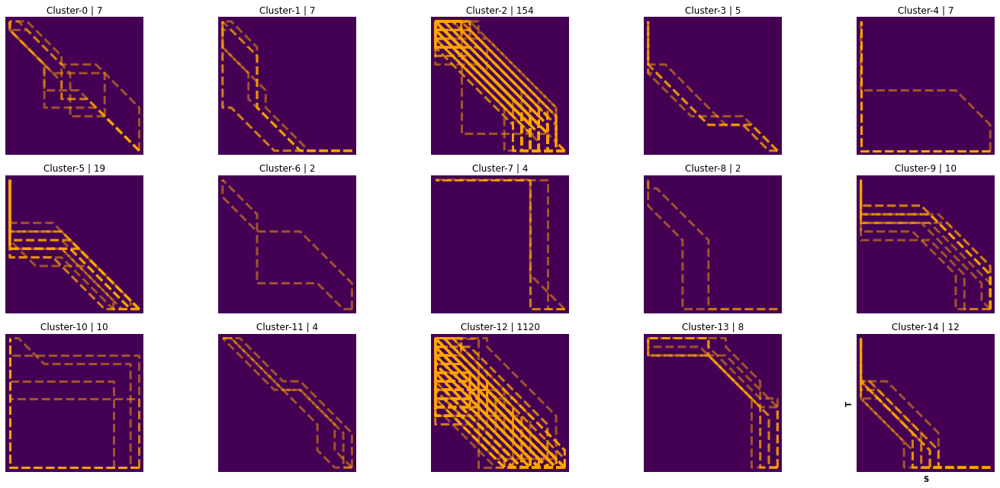

In [4]:
E = ClusterUtils.run_hierarchical_clustering_with_binary_encode_alignment_path_hamming(aligner, DIST_THRESHOLD=0.3)
plt.savefig('results/spt_all_clusters.png')

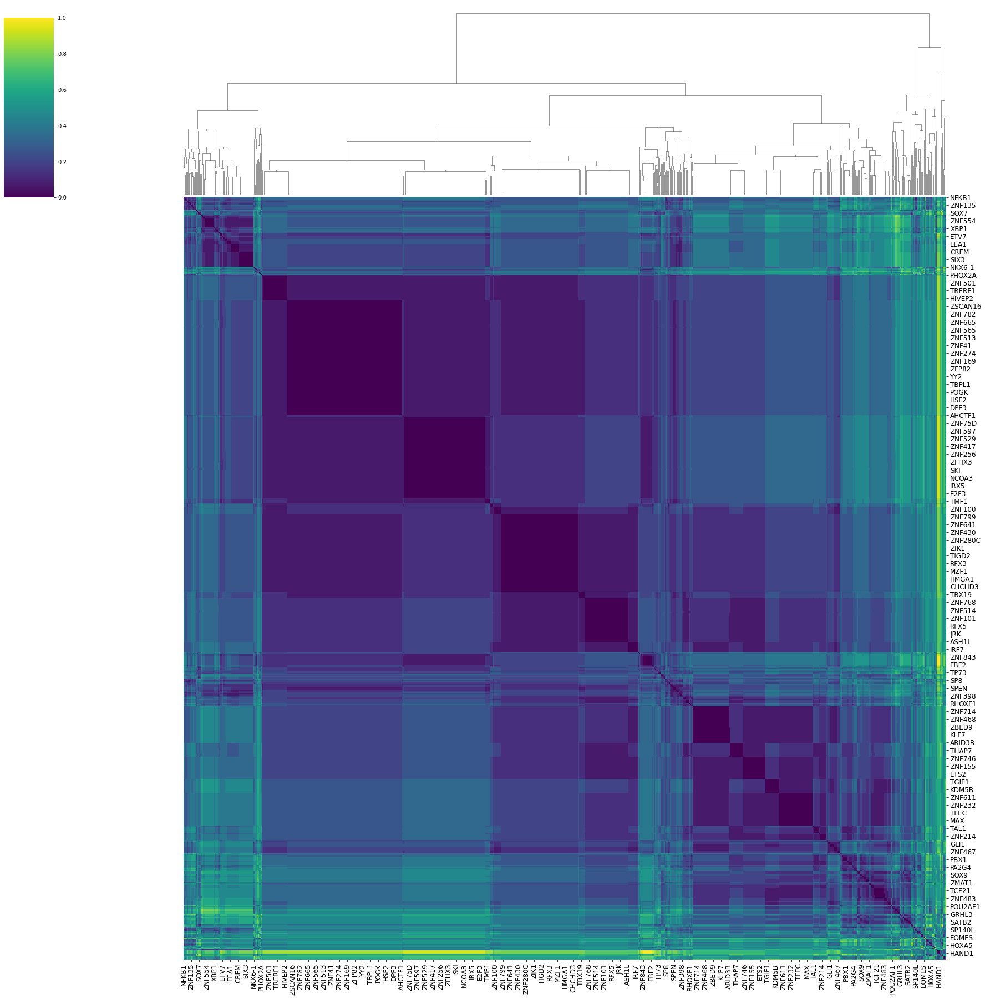

In [5]:
p = sb.clustermap(aligner.DistMat,cmap='viridis', figsize=(25,25))
p.ax_heatmap.set_xticklabels(p.ax_heatmap.get_xmajorticklabels(), fontsize = 12)
p.ax_heatmap.set_yticklabels(p.ax_heatmap.get_ymajorticklabels(), fontsize = 12)
p.ax_row_dendrogram.set_visible(False)
plt.savefig('results/SPT_all_geneclusters.png', bbox_inches = 'tight')

mean matched percentage:  60.91 %
mean matched percentage wrt ref:  73.82 %
mean matched percentage wrt query:  73.74 %


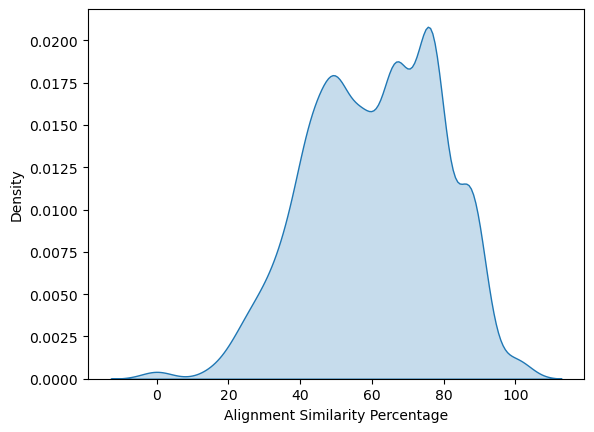

In [6]:
# The overall alignment distribution statistics
import matplotlib as mpl
mpl.style.use('default')
df = aligner.get_match_stat_for_all_genes() 
print('mean matched percentage: ', round(np.mean(df['match %']),2),'%' )
print('mean matched percentage wrt ref: ',round(np.mean(df['match % S']),2),'%'  )
print('mean matched percentage wrt query: ', round(np.mean(df['match % T']),2),'%' )
# average matched percentage by alignment cluster
df.groupby('cluster_id').mean()
#sb.kdeplot(df['match % S'], fill=True, label='match % Reference')
#sb.kdeplot(df['match % T'], fill=True,label='match % Query')
sb.kdeplot(df['match %'], fill=True,label='Alignment Similarity %')
#plt.legend()
plt.xlabel('Alignment Similarity Percentage')
plt.savefig('results/SPT_all_alignment_distributions.png')

In [7]:
import PathwayAnalyserV2

# Cluster specific overepresentation analysis ---> Clusters do not necessarily output similar gene programs -- If one pathway is overrepresented in several clusters, that means 
# that particular pathway has several gene subsets which match/mismatch differently along pseudotime. 
# Such clusters reveal pathways with such varying alignments
# They could be DE or non DE; Also a cluster might not have any significant overepresentation result as well
from tqdm import tqdm
import gseapy as gp
from gseapy import barplot, dotplot
import anndata
import time 
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sb
import scipy.stats as stats
import matplotlib.pyplot as plt
import os,sys,inspect
import pickle
from tqdm import tqdm
from tabulate import tabulate
def run_overrepresentation_analysis(gene_set, TARGET_GENESETS=['MSigDB_Hallmark_2020','KEGG_2021_Human']):
    enr = gp.enrichr(gene_list=gene_set,
                     gene_sets=TARGET_GENESETS,
                     organism='human',
                     outdir=None,
                       )
    df = enr.results[enr.results['Adjusted P-value']<0.05]
    if(df.shape[0]==0):
        return df
    df = df.sort_values('Adjusted P-value')
    df['-log10 Adjusted P-value'] = [-np.log10(q) for q in df['Adjusted P-value']]
    max_q = max(df['-log10 Adjusted P-value'][df['-log10 Adjusted P-value']!=np.inf])
    #df.columns = ['Gene_set']+list(df.columns[1:len(df.columns)])
    qvals = []
    for q in df['-log10 Adjusted P-value']:
        if(q==np.inf):
            q = -np.log10(0.00000000001) # NOTE: For -log10(p=0.0) we replace p with a very small p-val to avoid inf
        qvals.append(q)
    df['-log10 FDR q-val'] = qvals 
    df = df.sort_values('Adjusted P-value',ascending=True)
    return df
def run_cluster_overrepresentation_analysis(aligner):

    overrep_cluster_results = {}
    cluster_overrepresentation_results = [] 

    for cluster_id in tqdm(range(len(aligner.gene_clusters))):
        df = run_overrepresentation_analysis(aligner.gene_clusters[cluster_id])
        if(df.shape[0]==0):
            continue
        n_genes = len(aligner.gene_clusters[cluster_id])
        pathways = list(df.Term) 
        pathway_specific_genes = list(df.Genes) 
        sources = [str(s).split('_')[0] for s in list(df.Gene_set)] 

        if(n_genes<15):
            genes = aligner.gene_clusters[cluster_id]
        else:
            genes = aligner.gene_clusters[cluster_id][1:7] + [' ... '] +  aligner.gene_clusters[cluster_id][n_genes-7:n_genes]

        cluster_overrepresentation_results.append([cluster_id,n_genes,genes,pathways, pathway_specific_genes, sources]) 
        overrep_cluster_results[cluster_id] = df 

    results= pd.DataFrame(cluster_overrepresentation_results)
    #print(tabulate(results,  headers=['cluster_id','n_genes', 'Cluster genes', 'Pathways','Pathway genes','Source'],tablefmt="grid",maxcolwidths=[3, 3, 3,30,40,40,10])) 
    return overrep_cluster_results, results
    
#PathwayAnalyserV2.run_cluster_overrepresentation_analysis(aligner)
overrep_cluster_results, results = run_cluster_overrepresentation_analysis(aligner)
cid = 0
for cluster in aligner.gene_clusters:
    print(cid)
    for g in cluster:
        aligner.results_map[g].cluster_id = cid
    cid+=1

100%|██████████| 15/15 [00:54<00:00,  3.64s/it]

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14


In [10]:
#genes = aligner.show_ordered_alignments()

In [11]:

df = []
for g in genes:
    al_obj = aligner.results_map[g]
    df.append([g, al_obj.alignment_str, al_obj.get_series_match_percentage()[0], al_obj.cluster_id ] )
df = pd.DataFrame(df)
df.columns = ['Gene','5-state alignment string','Alignment similarity %','Cluster_id']
df

,Gene,5-state alignment string,Alignment similarity %,Cluster_id
0,HAND1,IIIIIIIIIIIIIIIDDDDDDDDDDDDDDD,0.00,4
1,LIN28A,IIIIIIIIIIIIIIIDDDDDDDDDDDDDDD,0.00,4
2,NACC2,IIIIIIIIIIIIIIIDDDDDDDDDDDDDDD,0.00,4
3,NME2,IIIIIIIIIIIIIIIDDDDDDDDDDDDDDD,0.00,4
4,POU5F1,IIIIIIIIIIIIIIIDDDDDDDDDDDDDDD,0.00,4
...,...,...,...,...
1366,SP6,IIIIIIIIDDDDDDDDMMMMMMM,30.43,5
1367,TEAD2,IIIIIIIIIIIIIIIDWWWWWWWDDDDDDD,23.33,10
1368,FOXH1,IIIIIIIIIIIIIIIDWWWWWWDDDDDDDD,20.00,10
1369,FOXF1,IIIIIIIIIIIIIIIDDWWWWWWWWWWWDD,36.67,10


In [26]:
cid in overrep_cluster_results.keys()

False

In [17]:
df.to_csv('results/SPT_all_gene_alignments.csv')

In [27]:
for cid in range(len(aligner.gene_clusters)):
    if(cid in overrep_cluster_results.keys()):
        overrep_cluster_results[cid].to_csv('results/SPT_all_cluster_pathways_overrep_results/SPT_all_cluster_'+str(cid)+'_pathways.csv')

In [ ]:
def plotTimeSeries(al_obj, refQueryAlignerObj, plot_cells = False, plot_mean_trend= False):
        plt.subplots(1,3,figsize=(15,3))
        plt.subplot(1,3,1)
        plotTimeSeriesAlignment(al_obj) 
        plt.subplot(1,3,2)
        
        max_val = np.max([np.max(np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene])), np.max(np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]))])
        min_val = np.min([np.min(np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene])), np.min(np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]))])

        g = sb.scatterplot(refQueryAlignerObj.query_time, np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]), alpha=0.7,  #hue=query_capture_time_labels,  
                       #palette=sb.color_palette("blend:#B9DBF4,#95AAD3,#3A68AE,#155289", as_cmap=True), legend=True)
                           #palette=sb.color_palette("light:#191970", as_cmap=True)
                           color = 'midnightblue', legend=False,linewidth=0.3, s=20)  #edgecolor='k'
        #plt.legend(title='Capture time',loc = 'lower right', labels=capture_time_points,fontsize=12 , bbox_to_anchor=(1.1, 1.05) )
        #plt.setp(g.get_legend().get_title(), fontsize='12')
        plt.title('LPS')
       # plt.xlabel('pseudotime')
      #  plt.ylabel('Gene expression', fontsize=14)
        plt.ylim([min_val-0.5,max_val+0.5])
        #sb.scatterplot(refQueryAlignerObj.ref_time, np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene]), color = 'black', alpha=0.4, legend=False, marker='+')
        plt.subplot(1,3,3)
        g = sb.scatterplot(refQueryAlignerObj.ref_time, np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene]), color = 'forestgreen', alpha=0.7, #hue=ref_capture_time_labels, 
                         # palette=sb.cubehelix_palette(start=2, rot=0, dark=0.2, light=.9, reverse=False, as_cmap=True), legend=False )
                         # palette=sb.color_palette("light:#228B22", as_cmap=True), legend=False)
                       #  palette=sb.color_palette("blend:#C8DBC8,#94C47D,#628D56,#335A30", as_cmap=True), 
                           legend=False,linewidth=0.3,s=20 ) #edgecolor='k'
       # plt.legend(title='Capture time',loc = 'lower right', labels=capture_time_points,fontsize=12 ,bbox_to_anchor=(1.1, 1.05))
       # plt.setp(g.get_legend().get_title(), fontsize='12')
        plt.title('PAM')
      #  plt.xlabel('pseudotime')
      #  plt.ylabel('Gene expression', fontsize=12)
        plt.ylim([min_val-0.5,max_val+0.5])
       # sb.scatterplot(refQueryAlignerObj.query_time, np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]), color = 'black', alpha=0.4, legend=False, marker='+')
 



In [ ]:
for g in aligner.gene_clusters[0]:
    plotTimeSeries(aligner.results_map[g], aligner, adata_ref, adata_query)
    print(aligner.results_map[g].alignment_str)

    plt.savefig('middlemismatched_cluster/middle_mismatched_cluster_'+g+'.png', bbox_inches='tight')

In [28]:
import PathwayAnalyserV2

# Cluster specific overepresentation analysis ---> Clusters do not necessarily output similar gene programs -- If one pathway is overrepresented in several clusters, that means 
# that particular pathway has several gene subsets which match/mismatch differently along pseudotime. 
# Such clusters reveal pathways with such varying alignments
# They could be DE or non DE; Also a cluster might not have any significant overepresentation result as well

# ----- Notable results from Euclidean distance -----
# All matched alignments are cluster 0 (the nearly matched fall into this as well.. which is good as the false positive start mismatch and end mismatch is compensated)
# Pathway TNF-alpha Signaling via NF-kB' is a hit in cluster 6 and 5    -- implying couple of alignment patterns <-- possibly Differential between the 2 systems 
# Cluster 4,8 has Signaling pathways regulating pluripotent stem cells; Cluster 8 has Hippo signalling pathway

# -- Notable results from Hamming distance
# 15 clusters ---
# Cluster 0 --['BATF2', 'FOXA2', 'GLIS3','HES7', 'POU3F1', 'SP9','ZNF385C'] with mismatches in the middle 
# Cluster 2,13,14,TNF-alpha Signaling via NF-kB' is a hit - implying couple of alignment patterns <-- possibly Differential between the 2 systems
# Cluster 4 - Pluripotency
# Cluster 10 - Hippo signalling 

PathwayAnalyserV2.run_cluster_overrepresentation_analysis(aligner)

# csv! TODO..

100%|██████████| 15/15 [00:39<00:00,  2.65s/it]

+----+--------------+-----------+--------------------------------+------------------------------------------+------------------------------------------+------------+
|    |   cluster_id |   n_genes | Cluster genes                  | Pathways                                 | Pathway genes                            | Source     |
+====+==============+===========+================================+==========================================+==========================================+============+
|  0 |            0 |         7 | ['BATF2', 'FOXA2', 'GLIS3',    | ['Maturity onset diabetes of the young', | ['FOXA2', 'FOXA2', 'BATF2', 'FOXA2']     | ['KEGG',   |
|    |              |           | 'HES7', 'POU3F1', 'SP9',       | 'Pancreas Beta Cells', 'PD-L1 expression |                                          | 'MSigDB',  |
|    |              |           | 'ZNF385C']                     | and PD-1 checkpoint pathway in cancer',  |                                          | 'KEGG',    |
|   

In [154]:
# ----- Notable results -----

for i in range(len(aligner.gene_clusters)):
    average_alignment, alignment_path =  ClusterUtils.get_cluster_average_alignments(aligner, aligner.gene_clusters[i] )
    mat = ClusterUtils.get_pairwise_match_count_mat(aligner, aligner.gene_clusters[i]  )
    print('Cluster-',i,' Average Alignment: ', average_alignment)
    #VisualUtils.VisualUtils.plot_alignment_path_on_given_matrix(paths = [alignment_path], mat=mat)
    #plt.xlabel('Reference')
    #plt.ylabel('Organoid')
    #plt.title('cluster-'+str(i))

Cluster- 0  Average Alignment:  IDMMMMMMIIIMDDWMMMM
Cluster- 1  Average Alignment:  IIIIIIDDDDIDIIIMMMMMDDDDD
Cluster- 2  Average Alignment:  IIIDMMMMMMMMMMMMDD
Cluster- 3  Average Alignment:  IIIIIDMMMMMMWMWDDMMM
Cluster- 4  Average Alignment:  IIIIIIIIIIIIIIDDDDMDDDDDDDDDD
Cluster- 5  Average Alignment:  IIIIIIIIDDDDDDMMWMMMMMD
Cluster- 6  Average Alignment:  MMMMMMMMMWMMVMVMD
Cluster- 7  Average Alignment:  IIIDDDMDDDMMMMMVVVVMMD
Cluster- 8  Average Alignment:  IIIIIIIIIIIIIIIDDDDDDDDDDDDDDD
Cluster- 9  Average Alignment:  IIIIIDDDDDDDDMMMMMMMIII
Cluster- 10  Average Alignment:  IIIIIIIIIIDDDDMMMMDDDDDIDD
Cluster- 11  Average Alignment:  DMMMMMMMMMDMMVVVMD
Cluster- 12  Average Alignment:  IIDMMMMMMMMMMMMMD
Cluster- 13  Average Alignment:  DDDDDIIMMWMMMMMIIIIIDID
Cluster- 14  Average Alignment:  IIIIIIIDMMMMVMMDIDDDDDDD


In [ ]:
# The overall alignment distribution statistics
df = aligner.get_match_stat_for_all_genes() 
print('mean matched percentage: ', round(np.mean(df['match %']),2),'%' )
print('mean matched percentage wrt ref: ',round(np.mean(df['match % S']),2),'%'  )
print('mean matched percentage wrt query: ', round(np.mean(df['match % T']),2),'%' )
# average matched percentage by alignment cluster
df.groupby('cluster_id').mean()
sb.kdeplot(df['match % S'], fill=True, label='match % S')
sb.kdeplot(df['match % T'], fill=True,label='match % T')
sb.kdeplot(df['match %'], fill=True,label='match %')
plt.legend(loc='upper left')

In [84]:
len(aligner.results[0].S.data_bins[0]) 

50

In [33]:
# Overrepresentation analysis of the top DE TFs along pseudotime based on alignment percentage < 40% 
import PathwayAnalyserV2
topDEgenes,rankedDEgenes = PathwayAnalyserV2.topkDE(aligner, DIFF_THRESHOLD=0.4)
df = PathwayAnalyserV2.run_overrepresentation_analysis(topDEgenes)

df.to_csv('results/SPT_all_overrep_results_top_k_DE_threshold_0.4sim_165genes.csv')
# We get 4 important results --  TNF-alpha signlaing via NF-kb, Signaling pathways regulating pluripotency of stem cells, Hippo signaling pathway, and IL2/STAT5 Signaling

165  # of DE genes to check


,Pathways,Pathway genes,Source
33,Signaling pathways regulating pluripotency of ...,DLX5;PCGF2;TCF7;HAND1;SMAD9;NANOG;ISL1;SKIL;PO...,KEGG_2021_Human
0,TNF-alpha Signaling via NF-kB,NR4A1;JUN;TSC22D1;CEBPD;REL;MXD1;JUNB;ATF3;REL...,MSigDB_Hallmark_2020
34,Transcriptional misregulation in cancer,MAF;SPI1;BCL11B;PAX8;ZBTB16;REL;ETV4;RUNX2;REL...,KEGG_2021_Human
35,Acute myeloid leukemia,TCF7L1;SPI1;ZBTB16;LEF1;TCF7;RELA,KEGG_2021_Human
36,Cushing syndrome,NR4A1;TCF7L1;ATF6B;CREB3L1;TCF7;LEF1;PBX1;CREB5,KEGG_2021_Human
37,Cocaine addiction,JUN;ATF6B;CREB3L1;RELA;CREB5,KEGG_2021_Human
38,Prostate cancer,TCF7L1;CREB3L1;TCF7;LEF1;RELA;CREB5,KEGG_2021_Human
39,Basal cell carcinoma,TCF7L1;LEF1;TCF7;GLI3;GLI2,KEGG_2021_Human
40,Cortisol synthesis and secretion,NR4A1;ATF6B;CREB3L1;PBX1;CREB5,KEGG_2021_Human
41,Thyroid cancer,TCF7L1;PAX8;LEF1;TCF7,KEGG_2021_Human


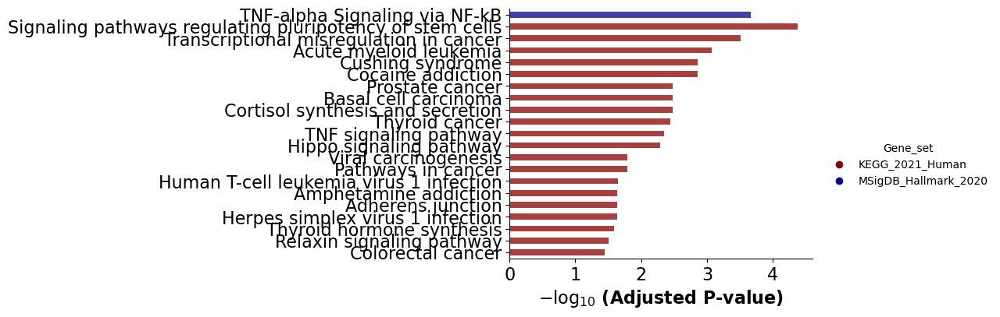

In [31]:
PathwayAnalyserV2.plot_overrep_results(df)
df = pd.DataFrame([df.Term, df.Genes, df.Gene_set]).transpose() 
df.columns = ['Pathways','Pathway genes','Source']
df

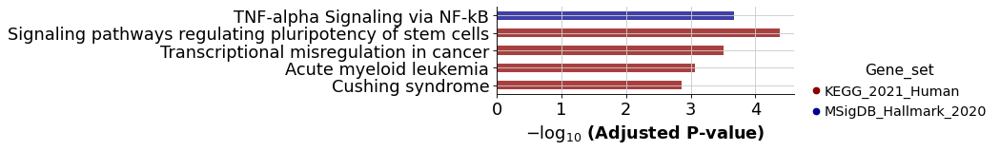

In [177]:
df = PathwayAnalyserV2.run_overrepresentation_analysis(topDEgenes)
df = df.sort_values('Adjusted P-value')
PathwayAnalyserV2.plot_overrep_results(df[0:5])

In [165]:
pickle.dump(df, open('../df_enrichr_top165DE_SPT.pkl', 'wb')) 

In [78]:
# Below is the ranked list of genes based on alignment percentage

import PathwayAnalyserV2
topDEgenes,rankedDEgenes = PathwayAnalyserV2.topkDE(aligner, DIFF_THRESHOLD=0.4)
x = PathwayAnalyserV2.get_ranked_genelist(aligner)
x = pd.DataFrame(x)
# We compute the Log2 fold change of their mean expression
l2fc = []
for gene in x.index:
    l2fc.append(np.log2(np.mean(list(aligner.ref_mat.loc[:,gene])  )/np.mean(list(aligner.query_mat.loc[:,gene])) )) 
x[2] = l2fc
x.columns = ['sim','l2fc']
x['abs_l2fc'] = np.abs(x['l2fc']) 
x = x.sort_values(['sim','abs_l2fc'],ascending=[True, False])



165  # of DE genes to check


In [79]:
x

,sim,l2fc,abs_l2fc
Gene,,,
LIN28A,0.0,-9.874639,9.874639
HAND1,0.0,-9.716765,9.716765
POU5F1,0.0,-9.417581,9.417581
SALL4,0.0,-4.871155,4.871155
NACC2,0.0,-4.715653,4.715653
...,...,...,...
PRRX1,1.0,0.860386,0.860386
FOXC2,1.0,0.851927,0.851927
OLIG2,1.0,0.623370,0.623370


In [4]:
# Let's pick the pathways of interest from the above list and check their alignment statistics
from gsea_api.molecular_signatures_db import MolecularSignaturesDatabase
from adjustText import adjust_text
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scipy.stats import zscore

class InterestingGeneSets:
    
    def __init__(self):        
        self.SETS = {}
        self.dbs = {}
        self.msigdb = MolecularSignaturesDatabase('../../msigdb', version='7.5.1')
        self.dbs['kegg'] = self.msigdb.load('c2.cp.kegg', 'symbols')
        self.dbs['hallmark'] = self.msigdb.load('h.all', 'symbols')
        self.dbs['gobp'] = self.msigdb.load('c5.go.bp', 'symbols')
        self.dbs['gocc'] = self.msigdb.load('c5.go.cc', 'symbols')
        self.dbs['reac'] = self.msigdb.load('c2.cp.reactome', 'symbols')
        
    def add_new_set_from_msigdb(self, db_name, dbsetname, avail_genes, usersetname):
        self.SETS[usersetname] = np.intersect1d(list(self.dbs[db_name].gene_sets_by_name[dbsetname].genes), avail_genes)

    def add_new_set(self, geneset, usersetname, avail_genes):
        geneset = np.asarray(geneset)
        self.SETS[usersetname] = geneset[np.where([g in avail_genes for g in geneset])]

        

def plot_alignment_path_on_given_matrix(mat, paths, cmap='viridis'):
        fig,ax = plt.subplots(1,1, figsize=(7,7))
        sb.heatmap(mat, square=True,  cmap='viridis', ax=ax, cbar=True,xticklabels=True, yticklabels=True)  
        for path in paths: 
            path_x = [p[0]+0.5 for p in path]
            path_y = [p[1]+0.5 for p in path]
            ax.plot(path_y, path_x, color='white', linewidth=6)
        plt.xlabel("Reference pseudotime",fontweight='bold')
        plt.ylabel("Organoid pseudotime",fontweight='bold')
        ax.xaxis.tick_top() # x axis on top
        ax.xaxis.set_label_position('top')        
        
        
        
        
def get_pathway_alignment_stat(aligner, pathway_name, cluster=False):
    
    print('PATHWAY ======= ',pathway_name)
    GENE_LIST = IGS.SETS[pathway_name]
    perct_A = []
    perct_S = []
    perct_T = []
    for gene in GENE_LIST:
        series_match_percent = aligner.results_map[gene].get_series_match_percentage()
        perct_A.append(series_match_percent[0])
        perct_S.append(series_match_percent[1])
        perct_T.append(series_match_percent[2])

    print('mean matched percentage: ', round(np.mean(perct_A),2),'%' )
    print('mean matched percentage wrt ref: ',round(np.mean(perct_S),2),'%'  )
    print('mean matched percentage wrt query: ', round(np.mean(perct_T),2),'%' )
    plt.subplots(1,1,figsize=(2,2))

    # average matched percentage by alignment cluster
    sb.kdeplot(perct_S, fill=True, label='match % S')
    sb.kdeplot(perct_T, fill=True,label='match % T')
    sb.kdeplot(perct_A, fill=True,label='match %')
    plt.title(pathway_name)
    plt.legend()
    average_alignment, alignment_path =  ClusterUtils.get_cluster_average_alignments(aligner, GENE_LIST)
    mat = ClusterUtils.get_pairwise_match_count_mat(aligner,GENE_LIST )
    print('Average Alignment: ', average_alignment)
    plot_alignment_path_on_given_matrix(paths = [alignment_path], mat=mat)
    plt.xlabel('Reference pseudotime')
    plt.ylabel('Organoid pseudotime')
    plt.savefig('T1_vs_ATO_'+pathway_name+'_overall_alignment.pdf')
    plot_mean_trend_heatmaps(pathway_name,cluster=cluster) 

def plot_DE_genes(pathway_name):
    PATHWAY_SET = IGS.SETS[pathway]
    ax=sb.scatterplot(x['l2fc'],x['sim']*100,s=50, legend=False, hue =x['sim'] ,palette=sb.diverging_palette(15, 133, s=50, as_cmap=True),edgecolor='k',linewidth=0.3)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel('Alignment Similarity %', fontsize=12, fontweight='bold')
    plt.xlabel('L2FC mean expression', fontsize = 12, fontweight='bold')
    plt.grid(False)
    plt.tight_layout()

    TEXTS = [] 
    for label, a, b in zip(x.index, x['l2fc'],x['sim']*100):
        if(label in PATHWAY_SET):# and b<=50):
            TEXTS.append(ax.text(a, b, label, color='white', fontsize=9, fontweight='bold',bbox=dict(boxstyle='round,pad=0.1', fc='black', alpha=0.75)))
    adjust_text(TEXTS, expand_points=(2, 2),arrowprops=dict(arrowstyle="->", color='black', lw=2))
    plt.title(pathway_name,fontweight='bold', fontsize=15)
    
    
def plot_heatmaps(mat_ref,mat_query,pathway_name, cluster=False):
    
    if(cluster):
        g=sb.clustermap(mat_ref, figsize=(0.4,0.4), col_cluster=False) 
        gene_order = g.dendrogram_row.reordered_ind
        df = pd.DataFrame(g.data2d) 
        df.index = IGS.SETS[pathway_name][gene_order]
    else:
        df=mat_ref
    
    plt.subplots(1,2,figsize=(8,14))
    max_val = np.max([np.max(mat_ref),np.max(mat_query)]) 
    min_val = np.min([np.min(mat_ref),np.min(mat_query)]) 
    plt.subplot(1,2,1)
    ax=sb.heatmap(df, vmax=max_val,vmin=min_val, cbar_kws = dict(use_gridspec=False,location="top")) 
    plt.title('Reference')
    ax.yaxis.set_label_position("left")
    for tick in ax.get_yticklabels():
        tick.set_rotation(360)
    plt.subplot(1,2,2)
    if(cluster):
        mat_query = mat_query.loc[IGS.SETS[pathway_name][gene_order]] 
    ax = sb.heatmap(mat_query,vmax=max_val,  vmin=min_val,cbar_kws = dict(use_gridspec=False,location="top"), yticklabels=False) 
    plt.title('Organoid')
    plt.savefig(pathway_name+'_heatmap.pdf')
    plt.show()
    
    
# smoothened/interpolated mean trends + Z normalisation 
def plot_mean_trend_heatmaps(pathway_name, cluster=False):
    S_mat = []
    T_mat = []
    S_zmat = []
    T_zmat = []

    for gene in IGS.SETS[pathway_name]:

        fS = pd.DataFrame([aligner.results_map[gene].S.mean_trend, np.repeat('Ref', len(aligner.results_map[gene].S.mean_trend))]).transpose()
        fT = pd.DataFrame([aligner.results_map[gene].T.mean_trend, np.repeat('ATO', len(aligner.results_map[gene].T.mean_trend))]).transpose()
        f = pd.concat([fS,fT])
        f[0] = np.asarray(f[0], dtype=np.float64)
        from scipy.stats import zscore
        f['z_normalised'] = zscore(f[0])
        S_mat.append(np.asarray(f[f[1]=='Ref'][0]))
        T_mat.append(np.asarray(f[f[1]=='ATO'][0]))    
        S_zmat.append(np.asarray(f[f[1]=='Ref']['z_normalised']))
        T_zmat.append(np.asarray(f[f[1]=='ATO']['z_normalised']))  
    S_mat = pd.DataFrame(S_mat)
    T_mat = pd.DataFrame(T_mat)
    S_zmat = pd.DataFrame(S_zmat)
    T_zmat = pd.DataFrame(T_zmat)
    
    S_mat.index = IGS.SETS[pathway_name]
    T_mat.index = IGS.SETS[pathway_name]
    S_zmat.index = IGS.SETS[pathway_name]
    T_zmat.index = IGS.SETS[pathway_name]
    
    print('Interpolated mean trends')
    plot_heatmaps(S_mat, T_mat, pathway_name, cluster=cluster)
    print('Z-normalised Interpolated mean trends')
    plot_heatmaps(S_zmat, T_zmat, pathway_name,cluster=cluster)
    

IGS = InterestingGeneSets()
IGS.add_new_set_from_msigdb('kegg', 'KEGG_WNT_SIGNALING_PATHWAY',aligner.gene_list, 'WNT_signaling')
IGS.add_new_set_from_msigdb('kegg', 'KEGG_TGF_BETA_SIGNALING_PATHWAY',aligner.gene_list, 'TGF_beta_signaling')
IGS.add_new_set_from_msigdb('hallmark', 'HALLMARK_UV_RESPONSE_UP',aligner.gene_list, 'UV_response_up')
IGS.add_new_set_from_msigdb('kegg', 'KEGG_P53_SIGNALING_PATHWAY',aligner.gene_list, 'P53_signaling')
IGS.add_new_set_from_msigdb('hallmark', 'HALLMARK_WNT_BETA_CATENIN_SIGNALING',aligner.gene_list, 'WNT_Beta_Catenin_signaling')
IGS.add_new_set_from_msigdb('hallmark', 'HALLMARK_TNFA_SIGNALING_VIA_NFKB',aligner.gene_list, 'TNF_alpha_signaling_via_NFKB')
IGS.add_new_set_from_msigdb('reac', 'REACTOME_INTERLEUKIN_17_SIGNALING',aligner.gene_list, 'IL17_signaling')
IGS.add_new_set_from_msigdb('reac', 'REACTOME_C_TYPE_LECTIN_RECEPTORS_CLRS',aligner.gene_list, 'C-type_lectin_receptor_pathway')
IGS.add_new_set_from_msigdb('hallmark', 'HALLMARK_IL2_STAT5_SIGNALING',aligner.gene_list, 'IL2_STAT5_signaling')
IGS.add_new_set_from_msigdb('hallmark', 'HALLMARK_INTERFERON_ALPHA_RESPONSE',aligner.gene_list, 'IFN_alpha_response')
IGS.add_new_set_from_msigdb('gobp', 'GOBP_POSITIVE_REGULATION_OF_INTERLEUKIN_6_PRODUCTION',aligner.gene_list, 'PosReg_of_IL6_production')
IGS.add_new_set_from_msigdb('reac', 'REACTOME_TRANSCRIPTIONAL_REGULATION_OF_PLURIPOTENT_STEM_CELLS',aligner.gene_list, 'Reg_of_Pluripotency')
IGS.add_new_set_from_msigdb('gobp', 'GOBP_HIPPO_SIGNALING',aligner.gene_list, 'Hippo')

IGS.add_new_set(['LIN28A', 'POU5F1', 'SALL4', 'FOXH1', 'GATA6','HAND1'] , 'Pluripotency',aligner.gene_list)
IGS.add_new_set(['CD34','IGLL1','TRGC2', 'TRDC', 'PTCRA', 'TRBC2','TRAC','CD4','CD8A', 'CD8B'] , 'Known_Markers',aligner.gene_list)
IGS.add_new_set(['CCR9', 'CCR7'] , 'chemokine_receptors',aligner.gene_list)
IGS.add_new_set( ['CD5', 'CD27'], 'TCR_activation',aligner.gene_list)
IGS.add_new_set( ['PCNA', 'CDK1', 'MKI67'], 'proliferation',aligner.gene_list)
IGS.add_new_set( ['CCND2','CCND3'], 'cyclin_d',aligner.gene_list)
IGS.add_new_set( ['RAG1','RAG2'], 'recombination',aligner.gene_list)
IGS.add_new_set( ['HRK','BMF','TP53INP1'], 'apoptosis',aligner.gene_list)
IGS.add_new_set( ['ST18','HIVEP3','RGPD3','SMPD3','AQP3','RORC','SATB1','TOX2'], 'stage_markers',aligner.gene_list)
IGS.add_new_set( ['NR4A2', 'NR4A1', 'JUN', 'KLF6', 'NR4A3', 'TSC22D1', 'FOSB', 'FOS', 'JUNB', 'REL'], 'tnf_genes',aligner.gene_list)

pathways = list(IGS.SETS.keys())[0:12]

In [250]:
pathways 

['WNT_signaling',
 'TGF_beta_signaling',
 'UV_response_up',
 'P53_signaling',
 'WNT_Beta_Catenin_signaling',
 'TNF_alpha_signaling_via_NFKB',
 'IL17_signaling',
 'C-type_lectin_receptor_pathway',
 'IL2_STAT5_signaling',
 'IFN_alpha_response',
 'PosReg_of_IL6_production',
 'Reg_of_Pluripotency']

In [255]:
IGS.SETS['Hippo']

array(['SOX11', 'TEAD1', 'TEAD2', 'TEAD3', 'TEAD4'], dtype=object)

In [94]:
IGS.add_new_set(['BATF2', 'FOXA2', 'GLIS3', 'HES7', 'POU3F1', 'SP9', 'ZNF385C'], 'check1', aligner.gene_list)

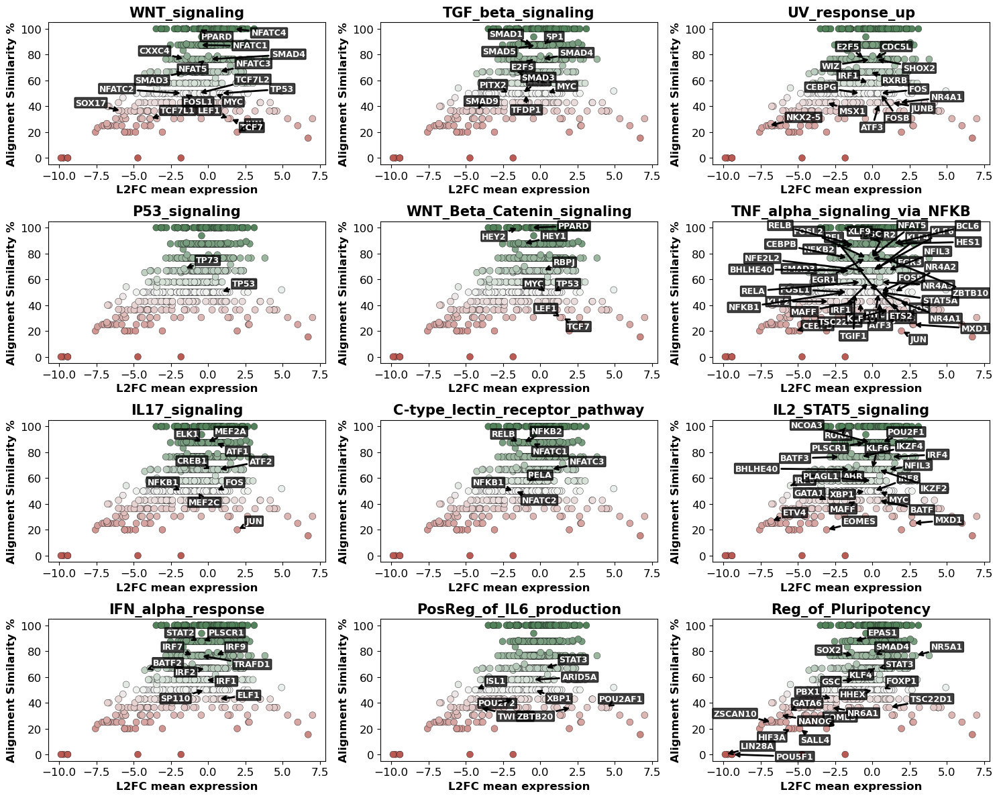

In [55]:
# Below is the ranked list of genes based on alignment percentage
x = PathwayAnalyserV2.get_ranked_genelist(aligner)
x = pd.DataFrame(x)
# We compute the Log2 fold change of their mean expression
l2fc = []
for gene in x.index:
    l2fc.append(np.log2(np.mean(list(aligner.ref_mat.loc[:,gene])  )/np.mean(list(aligner.query_mat.loc[:,gene])) )) 
x[2] = l2fc
x.columns = ['sim','l2fc']
x['color'] = np.repeat('green',x.shape[0])
x.loc[x['sim']<=0.5,'color'] = 'red'
plt.style.use('default')  
plt.subplots(4,3,figsize=(15,12))
i=1
for pathway in pathways:
    plt.subplot(4,3,i)
    plot_DE_genes(pathway)
    i+=1

500

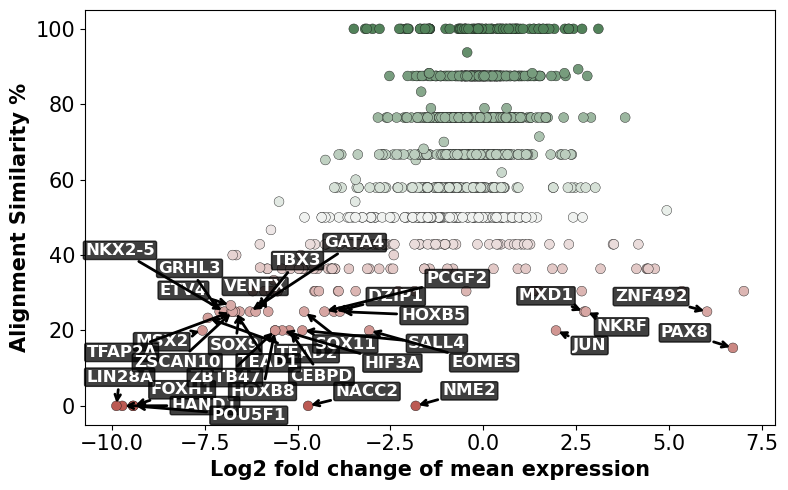

In [56]:
#Highlighting the most unaligned genes

#most_l2fc_genes = list(x.sort_values(['l2fc', 'sim'])[0:5].index) + list(x.sort_values(['l2fc', 'sim'])[1377-10:1377].index)
most_DE_genes = list(x[x['sim']<0.3].index) 
plt.subplots(1,1,figsize=(8,5))
ax=sb.scatterplot(x['l2fc'],x['sim']*100,s=50, legend=False, hue =x['sim'] ,palette=sb.diverging_palette(15, 133, s=50, as_cmap=True),edgecolor='k',linewidth=0.3)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.ylabel('Alignment Similarity %', fontsize=15, fontweight='bold')
plt.xlabel('Log2 fold change of mean expression', fontsize = 15, fontweight='bold')
plt.grid(False)
plt.tight_layout()
TEXTS = [] 
for i, gene in enumerate (x.index):
    if(x.index[i] in most_DE_genes):
       # plt.text(x['l2fc'][i],x['sim'][i]*100, gene,fontsize=12)
        TEXTS.append(ax.text(x['l2fc'][i], x['sim'][i]*100, x.index[i], color='white', fontsize=12, fontweight='bold',bbox=dict(boxstyle='round,pad=0.1', fc='black', alpha=0.75)))
adjust_text(TEXTS, expand_points=(2, 2),arrowprops=dict(arrowstyle="->", color='black', lw=2))

### Pathway alignment statistics

PATHWAY =======  Hippo
mean matched percentage:  28.94 %
mean matched percentage wrt ref:  50.67 %
mean matched percentage wrt query:  25.33 %
Average Alignment:  IIIIIIIIIDDDDDMMMMMDMDDD
Interpolated mean trends


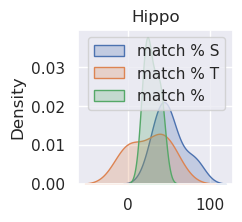

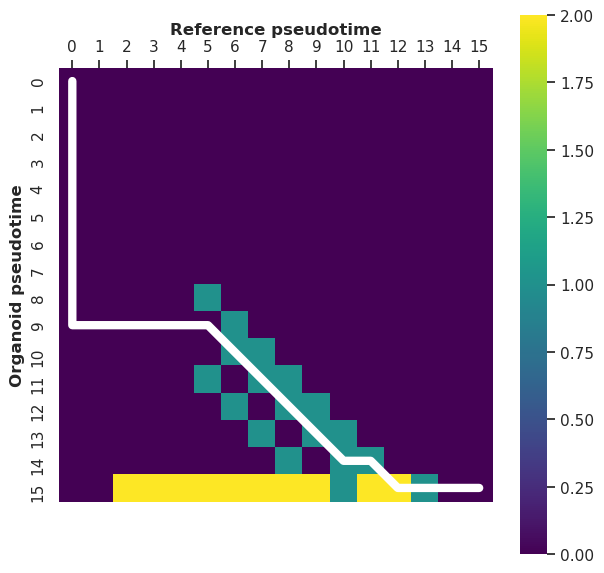

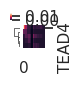

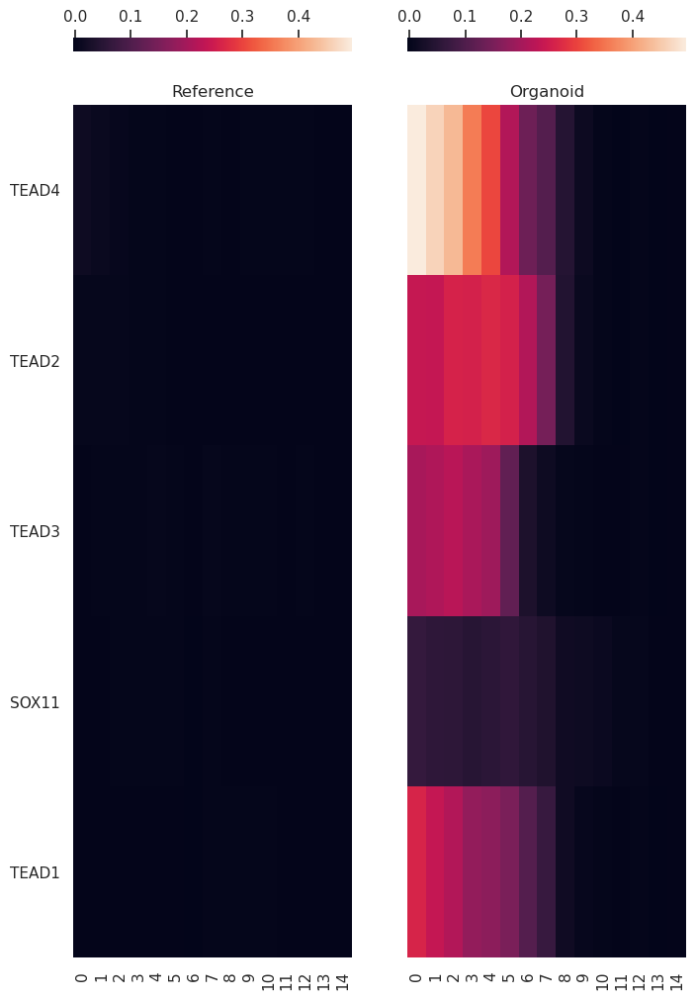

Z-normalised Interpolated mean trends


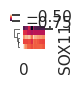

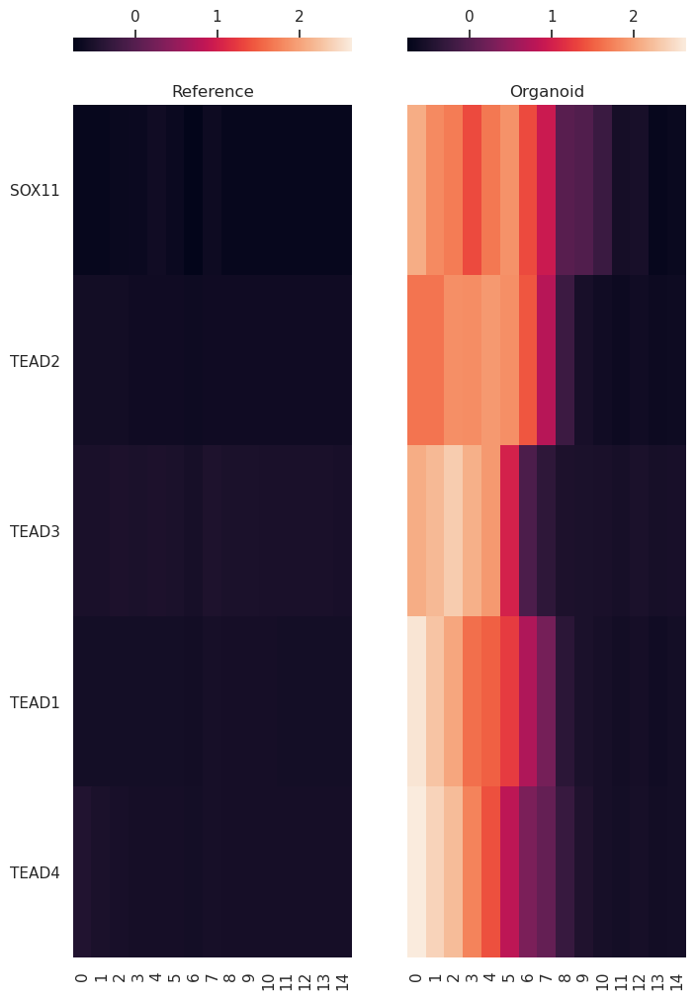

In [256]:
get_pathway_alignment_stat(aligner, 'Hippo', cluster=True)

PATHWAY =======  Reg_of_Pluripotency
mean matched percentage:  38.41 %
mean matched percentage wrt ref:  52.0 %
mean matched percentage wrt query:  48.33 %
Average Alignment:  IIIIIIIIDDDDDMMMMMMMDDD
Interpolated mean trends


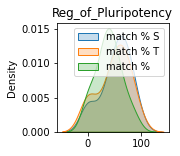

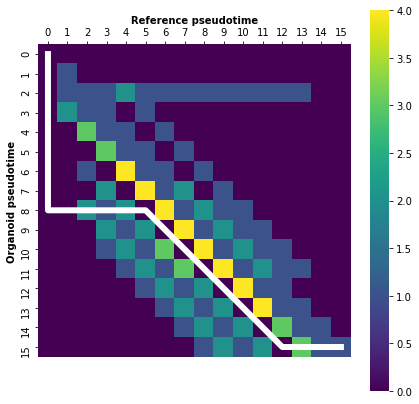

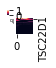

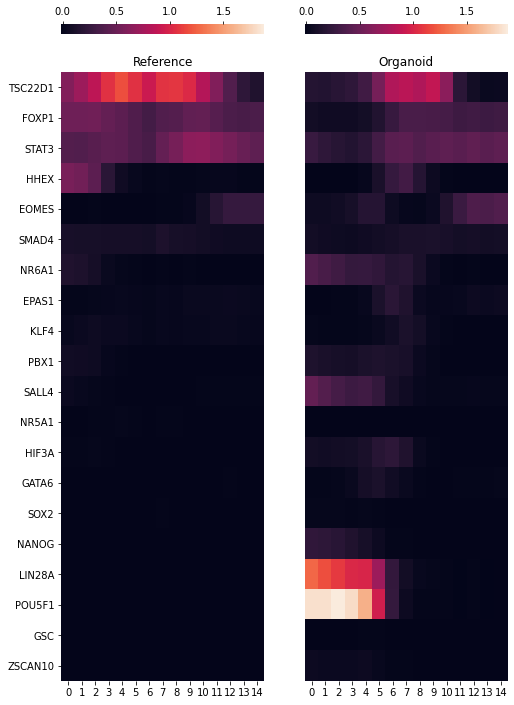

Z-normalised Interpolated mean trends


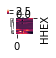

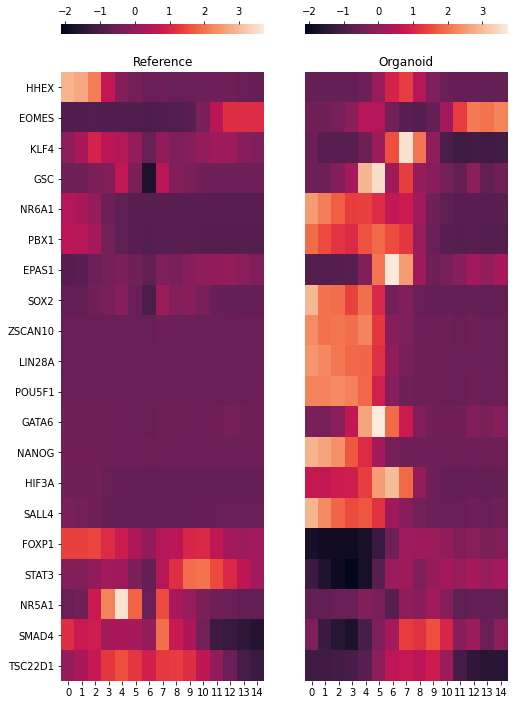

In [5]:
get_pathway_alignment_stat(aligner, 'Reg_of_Pluripotency', cluster=True)

PATHWAY =======  TNF_alpha_signaling_via_NFKB
mean matched percentage:  48.17 %
mean matched percentage wrt ref:  63.49 %
mean matched percentage wrt query:  63.49 %
Average Alignment:  IIIIIDDMMMMMMMMMMDDD
Interpolated mean trends


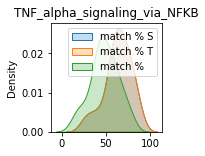

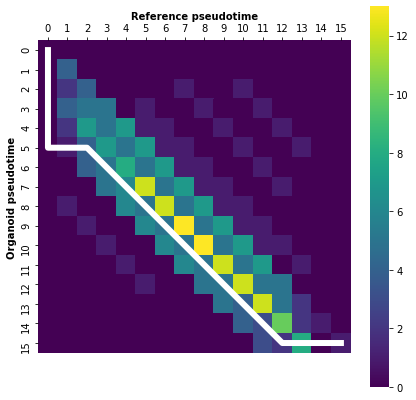

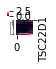

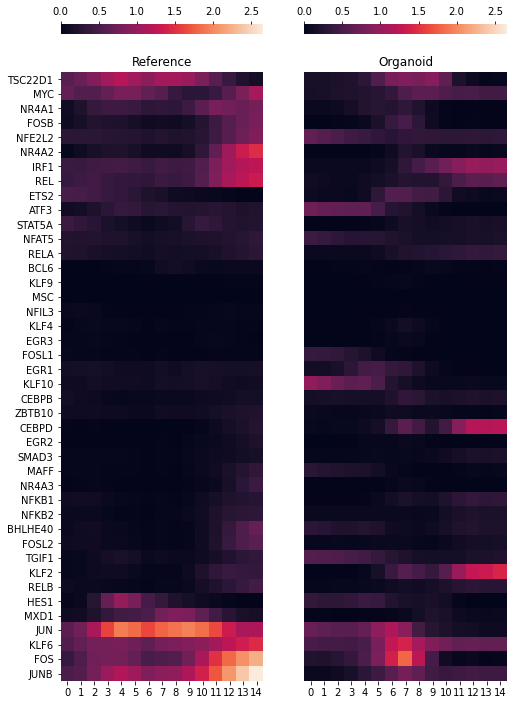

Z-normalised Interpolated mean trends


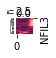

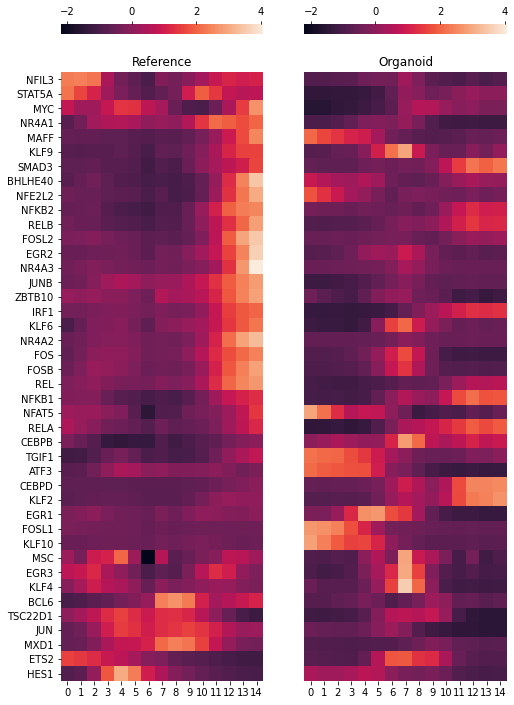

In [6]:
get_pathway_alignment_stat(aligner, 'TNF_alpha_signaling_via_NFKB', cluster=True)

In [87]:
def plotTimeSeries(al_obj, refQueryAlignerObj, adata_ref, adata_query, plot_mean_trend= False):
        plt.subplots(1,3,figsize=(15,3))
        plt.subplot(1,3,1)
        plotTimeSeriesAlignment(al_obj) 
        plt.subplot(1,3,2)
        
        query_capture_time_labels = np.asarray(adata_query.obs.time)
        ref_capture_time_labels = np.asarray(adata_ref.obs.time)
        
        #max_val = np.max(np.max(np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene])), np.max(np.asarray(refQueryAlignerObj.query_mat[al_obj.gene])))

        g = sb.scatterplot(refQueryAlignerObj.query_time, np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]), hue=query_capture_time_labels,  
                           palette=sb.color_palette("light:#191970", as_cmap=True), legend=False, edgecolor='k',linewidth=0.3) 
        plt.title('Organoid')
        plt.xlabel('pseudotime')
        plt.ylabel('log1p expression')
        #plt.ylim([0, max_val])
        sb.scatterplot(refQueryAlignerObj.ref_time, np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene]), color = 'black', alpha=0.1, legend=False, marker='+')
        plt.subplot(1,3,3)
        sb.scatterplot(refQueryAlignerObj.ref_time, np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene]), color = 'forestgreen', hue=ref_capture_time_labels, 
                         palette=sb.color_palette("blend:#C8DBC8,#94C47D,#628D56,#335A30", as_cmap=True), legend=False, edgecolor='k',linewidth=0.3 )
        plt.title('Reference')
        plt.xlabel('pseudotime')
        plt.ylabel('log1p expression')
        #plt.ylim([0, max_val])
        sb.scatterplot(refQueryAlignerObj.query_time, np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]), color = 'black', alpha=0.1, legend=False, marker='+')
            
def plotTimeSeriesAlignment(al_obj):  
        sb.scatterplot(al_obj.S.X, al_obj.S.Y, color = 'forestgreen' ,alpha=0.05, legend=False)#, label='Ref') 
        sb.scatterplot(al_obj.T.X, al_obj.T.Y, color = 'midnightblue' ,alpha=0.05, legend=False)#, label ='Query') 
       # plt.legend(loc='upper left')
        al_obj.plot_mean_trends() 
        plt.title(al_obj.gene + str(al_obj.get_series_match_percentage()))
        plt.xlabel('pseudotime')
        plt.ylabel('log1p expression')
        plt.axis('off')
        
        for i in range(al_obj.matched_region_DE_info.shape[0]):
            S_timebin = int(al_obj.matched_region_DE_info.iloc[i]['ref_bin'])
            T_timebin = int(al_obj.matched_region_DE_info.iloc[i]['query_bin']) 
            x_vals = [al_obj.matched_region_DE_info.iloc[i]['ref_pseudotime'],al_obj.matched_region_DE_info.iloc[i]['query_pseudotime']] 
            y_vals = [al_obj.S.mean_trend[S_timebin ], al_obj.T.mean_trend[T_timebin]] 
            plt.plot(x_vals, y_vals, color='black', linestyle='dashed', linewidth=0.6)
            
def plot_boxplots(geneset, adata_R, adata_Q):
    i=1
    plt.subplots(2,5,figsize=(15,6))
    for gene in geneset:
        ref_data = list(np.asarray(adata_R[:,gene].X.todense()).flatten()) 
        query_data = list(np.asarray(adata_Q[:,gene].X.todense()).flatten())
        df = pd.DataFrame([ref_data+ query_data,list(np.repeat('Reference', len(ref_data))) + list(np.repeat('Organoid', len(query_data))) ]).transpose()
        df.columns = ['expr','system']
        df['expr'] = np.asarray(df['expr'], dtype=float)
        plt.subplot(2,5,i)
        ax = sb.boxplot(data=df, y='expr',x='system', palette=['forestgreen','midnightblue'], width =0.5, notch=True, showcaps=False,flierprops={"marker": "x"}, 
                       boxprops={ 'edgecolor':'grey'})#, alpha=0.1) 
        plt.setp(ax.collections, alpha=.3)
        plt.xlabel('')
        plt.ylabel('Gene Expression', fontsize=10)
        plt.xticks(fontsize=6)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.spines['left'].set_visible(True)
        ax.spines['bottom'].set_visible(True)
        plt.grid(False)
        plt.title(gene, fontsize=12)
        plt.tight_layout()
        ax.set(xticklabels=[])
        ax.set(xticks=[])
        i=i+1
        if(i==11):
            break

In [37]:
'OCT4' in aligner.gene_list

False

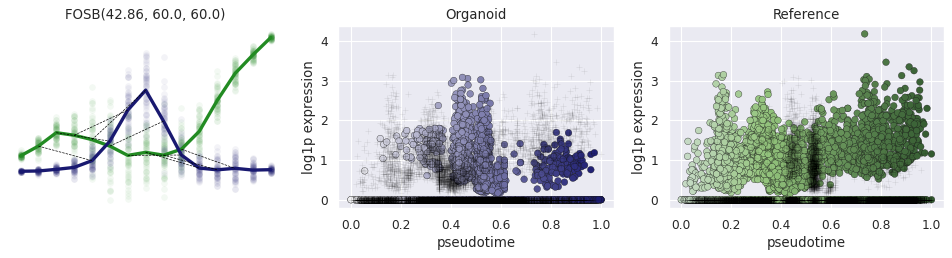

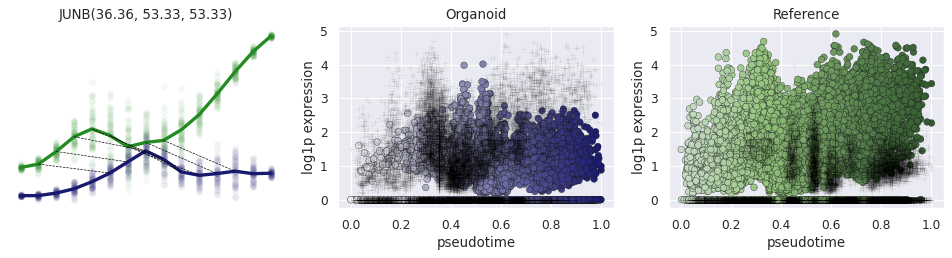

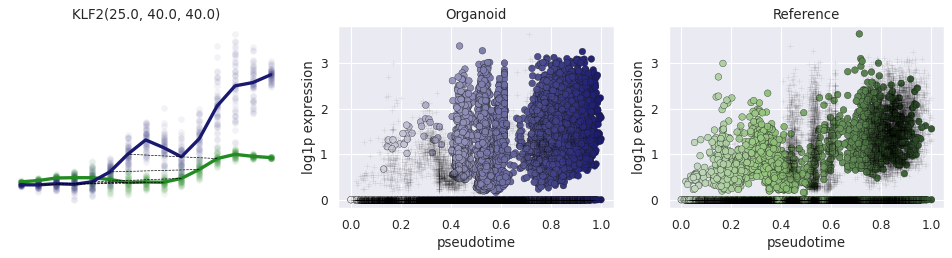

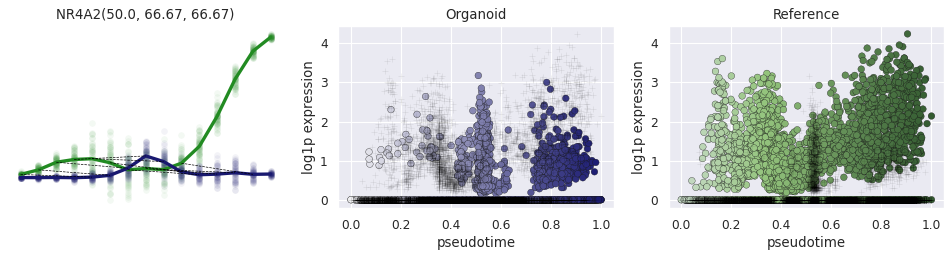

In [38]:
for g in np.intersect1d(['NR4A2', 'SOCS3', 'PLEK', 'FOSB', 'SIK1', 'JUNB', 'KLF2'],aligner.gene_list):
    plotTimeSeries(aligner.results_map[g], aligner, adata_ref, adata_query)

In [165]:
adata_ref[np.asarray(adata_ref[:,'SOX2'].X.todense()).flatten() > 0 ] # 25 cells
adata_query[np.asarray(adata_query[:,'SOX2'].X.todense()).flatten() > 0 ] # 40 cells

View of AnnData object with n_obs × n_vars = 40 × 20240
    obs: 'ANNOTATION_COMB', 'time', 'n_counts', 'refined_time', 'bin_ids', 'ID'
    var: 'n_cells'
    uns: 'log1p', 'ANNOTATION_COMB_colors'
    obsm: 'X_gplvm', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [170]:
print(np.unique(adata_ref[np.asarray(adata_ref[:,'SOX2'].X.todense()).flatten() > 0 ].obs.ANNOTATION_COMB, return_counts=True) )
print(np.unique(adata_query[np.asarray(adata_query[:,'SOX2'].X.todense()).flatten() > 0 ].obs.ANNOTATION_COMB , return_counts=True)) 

(array(['ABT(ENTRY)', 'DN(P)_T', 'DN(Q)_T', 'DP(P)_T', 'DP(Q)_T'],
      dtype=object), array([ 3,  1,  8, 10,  3]))
(array(['ENDOTHELIUM', 'HSC_MPP', 'HSC_MPP/LMPP_MLP/DC2',
       'MESODERMAL_PROGENITOR', 'PRIMITIVE_STREAK'], dtype=object), array([ 3,  1,  1,  2, 33]))


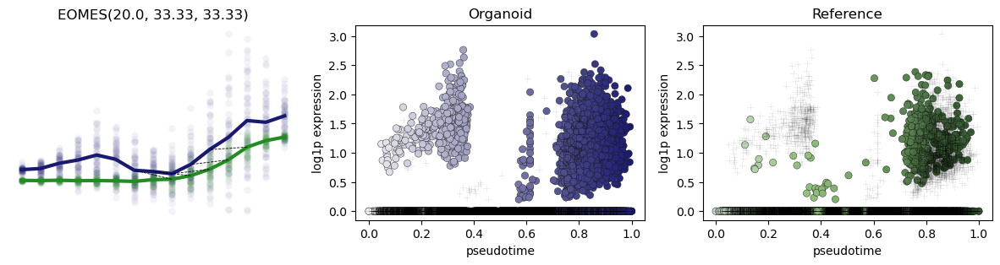

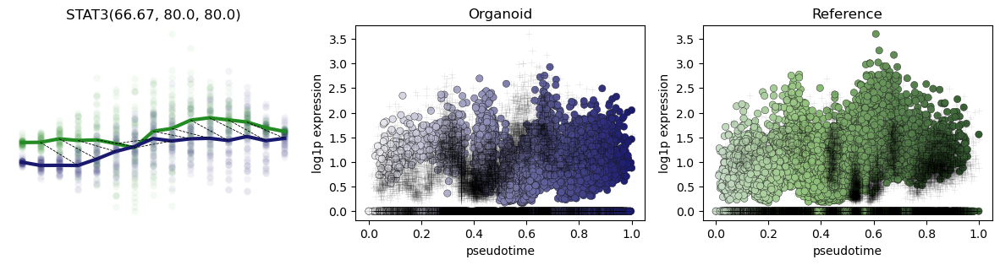

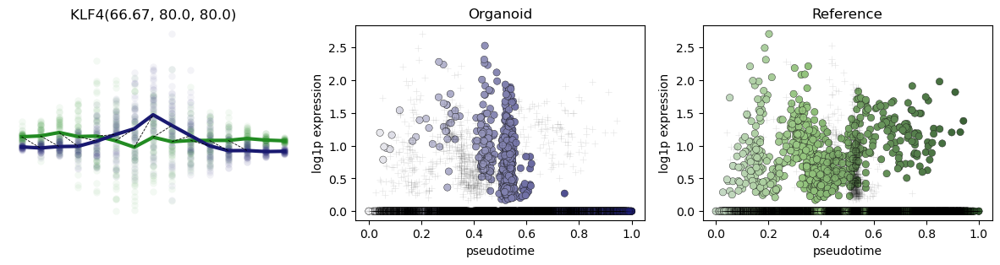

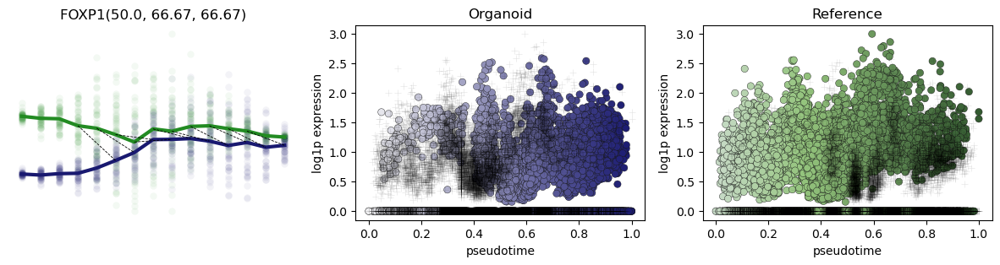

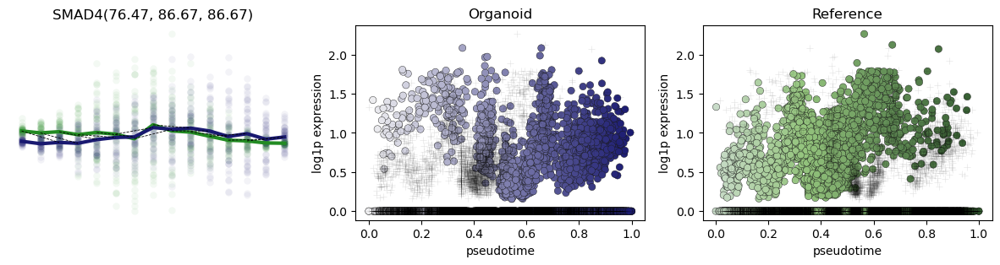

In [185]:
plotTimeSeries(aligner.results_map['EOMES'], aligner, adata_ref, adata_query)
plotTimeSeries(aligner.results_map['STAT3'], aligner, adata_ref, adata_query)
plotTimeSeries(aligner.results_map['KLF4'], aligner, adata_ref, adata_query)
plotTimeSeries(aligner.results_map['FOXP1'], aligner, adata_ref, adata_query)
plotTimeSeries(aligner.results_map['SMAD4'], aligner, adata_ref, adata_query)

In [2]:
#aligner.results_map['GATA6'].plotTimeSeries(aligner, plot_cells=True)
#aligner.results_map['GATA6'].alignment_str

In [ ]:
temp_df = []
for g in IGS.SETS['Reg_of_Pluripotency']:
    temp_df.append(aligner.results_map[g].get_series_match_percentage()[0])

temp_df = pd.DataFrame([IGS.SETS['Reg_of_Pluripotency'], temp_df]).transpose()
temp_df.columns = ['TF', 'matched%']
temp_df = temp_df.sort_values('matched%')
for g in temp_df['TF']: 
    plotTimeSeries(aligner.results_map[g], aligner, adata_ref, adata_query)

In [215]:
def plotTimeSeries(al_obj, refQueryAlignerObj, adata_ref, adata_query, plot_mean_trend= False):
        plt.subplots(1,1,figsize=(5,3))
      #  plt.subplot(1,3,1)
        plotTimeSeriesAlignment(al_obj) 
        return
      #  plt.subplot(1,3,2)
        
        query_capture_time_labels = np.asarray(adata_query.obs.time)
        ref_capture_time_labels = np.asarray(adata_ref.obs.time)
        
        #max_val = np.max(np.max(np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene])), np.max(np.asarray(refQueryAlignerObj.query_mat[al_obj.gene])))

        g = sb.scatterplot(refQueryAlignerObj.query_time, np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]), hue=query_capture_time_labels,  
                           palette=sb.color_palette("light:#191970", as_cmap=True), legend=False, edgecolor='k',linewidth=0.3) 
        plt.title('Organoid')
        plt.xlabel('pseudotime')
        plt.ylabel('log1p expression')
        #plt.ylim([0, max_val])
        sb.scatterplot(refQueryAlignerObj.ref_time, np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene]), color = 'black', alpha=0.1, legend=False, marker='+')
        plt.subplot(1,3,3)
        sb.scatterplot(refQueryAlignerObj.ref_time, np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene]), color = 'forestgreen', hue=ref_capture_time_labels, 
                         palette=sb.color_palette("blend:#C8DBC8,#94C47D,#628D56,#335A30", as_cmap=True), legend=False, edgecolor='k',linewidth=0.3 )
        plt.title('Reference')
        plt.xlabel('pseudotime')
        plt.ylabel('log1p expression')
        #plt.ylim([0, max_val])
        sb.scatterplot(refQueryAlignerObj.query_time, np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]), color = 'black', alpha=0.1, legend=False, marker='+')
            
def plotTimeSeriesAlignment(al_obj):  
        sb.scatterplot(al_obj.S.X, al_obj.S.Y, color = 'forestgreen' ,alpha=0.05, legend=False)#, label='Ref') 
        sb.scatterplot(al_obj.T.X, al_obj.T.Y, color = 'midnightblue' ,alpha=0.05, legend=False)#, label ='Query') 
       # plt.legend(loc='upper left')
        al_obj.plot_mean_trends() 
        plt.title(al_obj.gene + str(al_obj.get_series_match_percentage()))
        plt.xlabel('pseudotime')
        plt.ylabel('log1p expression')
        plt.axis('off')
        
        for i in range(al_obj.matched_region_DE_info.shape[0]):
            S_timebin = int(al_obj.matched_region_DE_info.iloc[i]['ref_bin'])
            T_timebin = int(al_obj.matched_region_DE_info.iloc[i]['query_bin']) 
            x_vals = [al_obj.matched_region_DE_info.iloc[i]['ref_pseudotime'],al_obj.matched_region_DE_info.iloc[i]['query_pseudotime']] 
            y_vals = [al_obj.S.mean_trend[S_timebin ], al_obj.T.mean_trend[T_timebin]] 
            plt.plot(x_vals, y_vals, color='black', linestyle='dashed', linewidth=0.6)
            
def plot_boxplots(geneset, adata_R, adata_Q):
    i=1
    plt.subplots(2,5,figsize=(15,6))
    for gene in geneset:
        ref_data = list(np.asarray(adata_R[:,gene].X.todense()).flatten()) 
        query_data = list(np.asarray(adata_Q[:,gene].X.todense()).flatten())
        df = pd.DataFrame([ref_data+ query_data,list(np.repeat('Reference', len(ref_data))) + list(np.repeat('Organoid', len(query_data))) ]).transpose()
        df.columns = ['expr','system']
        df['expr'] = np.asarray(df['expr'], dtype=float)
        plt.subplot(2,5,i)
        ax = sb.boxplot(data=df, y='expr',x='system', palette=['forestgreen','midnightblue'], width =0.5, notch=True, showcaps=False,flierprops={"marker": "x"}, 
                       boxprops={ 'edgecolor':'grey'})#, alpha=0.1) 
        plt.setp(ax.collections, alpha=.3)
        plt.xlabel('')
        plt.ylabel('Gene Expression', fontsize=10)
        plt.xticks(fontsize=6)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.spines['left'].set_visible(True)
        ax.spines['bottom'].set_visible(True)
        plt.grid(False)
        plt.title(gene, fontsize=12)
        plt.tight_layout()
        ax.set(xticklabels=[])
        ax.set(xticks=[])
        i=i+1
        if(i==11):
            break

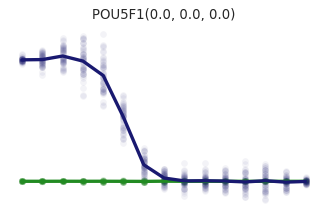

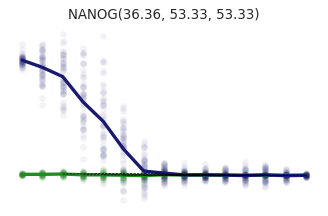

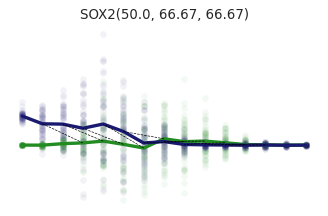

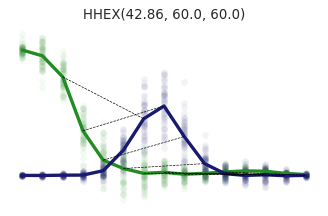

In [218]:
for g in ['POU5F1','NANOG','SOX2','HHEX']: 
    plotTimeSeries(aligner.results_map[g], aligner, adata_ref, adata_query)
    plt.savefig(g+'_SPT_pluripotent.pdf')

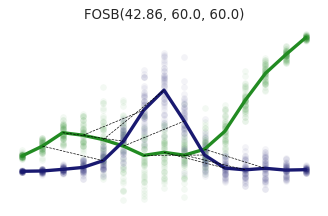

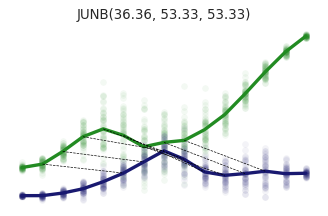

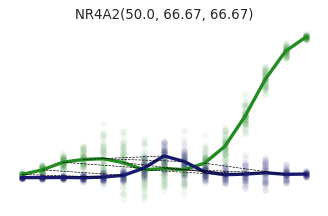

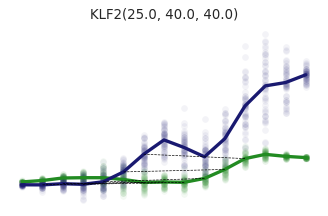

In [219]:
for g in ['FOSB','JUNB','NR4A2','KLF2']: 
    plotTimeSeries(aligner.results_map[g], aligner, adata_ref, adata_query)
    plt.savefig(g+'_SPT_tnf.pdf')

In [ ]:
    def plotTimeSeries(al_obj, refQueryAlignerObj, plot_cells = False, plot_mean_trend= False):
        plt.subplots(1,3,figsize=(15,3))
        plt.subplot(1,3,1)
        plotTimeSeriesAlignment(al_obj) 
        plt.subplot(1,3,2)
        
        max_val = np.max([np.max(np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene])), np.max(np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]))])
        min_val = np.min([np.min(np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene])), np.min(np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]))])

        g = sb.scatterplot(refQueryAlignerObj.query_time, np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]), alpha=0.7,  #hue=query_capture_time_labels,  
                       #palette=sb.color_palette("blend:#B9DBF4,#95AAD3,#3A68AE,#155289", as_cmap=True), legend=True)
                           #palette=sb.color_palette("light:#191970", as_cmap=True)
                           color = 'midnightblue', legend=False,linewidth=0.3, s=20)  #edgecolor='k'
        #plt.legend(title='Capture time',loc = 'lower right', labels=capture_time_points,fontsize=12 , bbox_to_anchor=(1.1, 1.05) )
        #plt.setp(g.get_legend().get_title(), fontsize='12')
        plt.title('Organoid')
       # plt.xlabel('pseudotime')
      #  plt.ylabel('Gene expression', fontsize=14)
        plt.ylim([min_val-0.5,max_val+0.5])
        #sb.scatterplot(refQueryAlignerObj.ref_time, np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene]), color = 'black', alpha=0.4, legend=False, marker='+')
        plt.subplot(1,3,3)
        g = sb.scatterplot(refQueryAlignerObj.ref_time, np.asarray(refQueryAlignerObj.ref_mat[al_obj.gene]), color = 'forestgreen', alpha=0.7, #hue=ref_capture_time_labels, 
                         # palette=sb.cubehelix_palette(start=2, rot=0, dark=0.2, light=.9, reverse=False, as_cmap=True), legend=False )
                         # palette=sb.color_palette("light:#228B22", as_cmap=True), legend=False)
                       #  palette=sb.color_palette("blend:#C8DBC8,#94C47D,#628D56,#335A30", as_cmap=True), 
                           legend=False,linewidth=0.3,s=20 ) #edgecolor='k'
       # plt.legend(title='Capture time',loc = 'lower right', labels=capture_time_points,fontsize=12 ,bbox_to_anchor=(1.1, 1.05))
       # plt.setp(g.get_legend().get_title(), fontsize='12')
        plt.title('PAM')
      #  plt.xlabel('pseudotime')
      #  plt.ylabel('Gene expression', fontsize=12)
        plt.ylim([min_val-0.5,max_val+0.5])
       # sb.scatterplot(refQueryAlignerObj.query_time, np.asarray(refQueryAlignerObj.query_mat[al_obj.gene]), color = 'black', alpha=0.4, legend=False, marker='+')
 

        plotTimeSeries(aligner.results_map['BATF'], aligner, plot_cells=True) 
        #plt.savefig('Figures/'+g+'.pdf', bbox_inches = 'tight')